### Instal·lació de topGO

In [ ]:
install.packages("BiocManager")
BiocManager::install("topGO")
#Per si s'ha de tornar a instal·lar topGO 

# Creació de la taula

### Generar la taula

In [16]:
#Aquesta funció et retorna la taula desitjada on dona les edats d'una variant significativa en una metapoblació, FILTRANT LES 15 VARIANTS AMB MAJOR ISAFE A CADA POBLACIÓ
#si no són significativament diferents les unes respecte a les altres en les diferents poblacions
#Es consideren significatives puntuacions d'iSAFE >0.1 i edats de variants amb qualitat >0.5
#No hi ha cap nombre mínim de variants significatives d'iSAFE per filtrar
variantage_table_kw <- function(pophumanscan = phs, AFR = AFRpops, EAS = EASpops, EUR = EURpops, SAS = SASpops) {
    #Valors mínims dels estadístics per filtrar (per canviar si fa falta)
    min_iSAFE <- 0.1
    #La taula haurà de tenir tantes files com regions a pophumanscan
    l <- nrow(pophumanscan)
    #Creo la taula buida on guardar tota la informació que busquem però amb totes les files ja i tot amb NA
    #A GeneID, ja puc guardar directament la columna sencera dels gens, igual que ID i metapop_PHS, que diu les poblacions on s'ha detectat
    taula <- data.table(Region = as.character(rep(NA,l)), ID = pophumanscan$sweepGroup, GeneID = pophumanscan$GeneID, metapop_PHS = pophumanscan$rawMetapopulation,
                        AFR = as.numeric(rep(NA,l)), AFR_n = as.numeric(rep(NA,l)), AFR_test = as.character(rep(NA,l)), AFR_aoh = as.numeric(rep(NA,l)),
                        EUR = as.numeric(rep(NA,l)), EUR_n = as.numeric(rep(NA,l)), EUR_test = as.character(rep(NA,l)), EUR_aoh = as.numeric(rep(NA,l)),
                        EAS = as.numeric(rep(NA,l)), EAS_n = as.numeric(rep(NA,l)), EAS_test = as.character(rep(NA,l)), EAS_aoh = as.numeric(rep(NA,l)),
                        SAS = as.numeric(rep(NA,l)), SAS_n = as.numeric(rep(NA,l)), SAS_test = as.character(rep(NA,l)), SAS_aoh = as.numeric(rep(NA,l)),
                        Cause = as.character(rep(NA,l)),
                        YRI_isafe_max = as.numeric(rep(NA, l)), YRI_age_median = as.numeric(rep(NA,l)), YRI_age_sd = as.numeric(rep(NA,l)), YRI_num = as.numeric(rep(NA,l)),
                        LWK_isafe_max = as.numeric(rep(NA, l)), LWK_age_median = as.numeric(rep(NA,l)), LWK_age_sd = as.numeric(rep(NA,l)), LWK_num = as.numeric(rep(NA,l)),
                        GWD_isafe_max = as.numeric(rep(NA, l)), GWD_age_median = as.numeric(rep(NA,l)), GWD_age_sd = as.numeric(rep(NA,l)), GWD_num = as.numeric(rep(NA,l)),
                        MSL_isafe_max = as.numeric(rep(NA, l)), MSL_age_median = as.numeric(rep(NA,l)), MSL_age_sd = as.numeric(rep(NA,l)), MSL_num = as.numeric(rep(NA,l)),
                        ESN_isafe_max = as.numeric(rep(NA, l)), ESN_age_median = as.numeric(rep(NA,l)), ESN_age_sd = as.numeric(rep(NA,l)), ESN_num = as.numeric(rep(NA,l)),
                        ACB_isafe_max = as.numeric(rep(NA, l)), ACB_age_median = as.numeric(rep(NA,l)), ACB_age_sd = as.numeric(rep(NA,l)), ACB_num = as.numeric(rep(NA,l)), 
                        ASW_isafe_max = as.numeric(rep(NA, l)), ASW_age_median = as.numeric(rep(NA,l)), ASW_age_sd = as.numeric(rep(NA,l)), ASW_num = as.numeric(rep(NA,l)), 
                        CEU_isafe_max = as.numeric(rep(NA, l)), CEU_age_median = as.numeric(rep(NA,l)), CEU_age_sd = as.numeric(rep(NA,l)), CEU_num = as.numeric(rep(NA,l)), 
                        TSI_isafe_max = as.numeric(rep(NA, l)), TSI_age_median = as.numeric(rep(NA,l)), TSI_age_sd = as.numeric(rep(NA,l)), TSI_num = as.numeric(rep(NA,l)),
                        FIN_isafe_max = as.numeric(rep(NA, l)), FIN_age_median = as.numeric(rep(NA,l)), FIN_age_sd = as.numeric(rep(NA,l)), FIN_num = as.numeric(rep(NA,l)),
                        GBR_isafe_max = as.numeric(rep(NA, l)), GBR_age_median = as.numeric(rep(NA,l)), GBR_age_sd = as.numeric(rep(NA,l)), GBR_num = as.numeric(rep(NA,l)),
                        IBS_isafe_max = as.numeric(rep(NA, l)), IBS_age_median = as.numeric(rep(NA,l)), IBS_age_sd = as.numeric(rep(NA,l)), IBS_num = as.numeric(rep(NA,l)),
                        CHB_isafe_max = as.numeric(rep(NA, l)), CHB_age_median = as.numeric(rep(NA,l)), CHB_age_sd = as.numeric(rep(NA,l)), CHB_num = as.numeric(rep(NA,l)),
                        JPT_isafe_max = as.numeric(rep(NA, l)), JPT_age_median = as.numeric(rep(NA,l)), JPT_age_sd = as.numeric(rep(NA,l)), JPT_num = as.numeric(rep(NA,l)),
                        CHS_isafe_max = as.numeric(rep(NA, l)), CHS_age_median = as.numeric(rep(NA,l)), CHS_age_sd = as.numeric(rep(NA,l)), CHS_num = as.numeric(rep(NA,l)),
                        CDX_isafe_max = as.numeric(rep(NA, l)), CDX_age_median = as.numeric(rep(NA,l)), CDX_age_sd = as.numeric(rep(NA,l)), CDX_num = as.numeric(rep(NA,l)), 
                        KHV_isafe_max = as.numeric(rep(NA, l)), KHV_age_median = as.numeric(rep(NA,l)), KHV_age_sd = as.numeric(rep(NA,l)), KHV_num = as.numeric(rep(NA,l)),
                        GIH_isafe_max = as.numeric(rep(NA, l)), GIH_age_median = as.numeric(rep(NA,l)), GIH_age_sd = as.numeric(rep(NA,l)), GIH_num = as.numeric(rep(NA,l)), 
                        PJL_isafe_max = as.numeric(rep(NA, l)), PJL_age_median = as.numeric(rep(NA,l)), PJL_age_sd = as.numeric(rep(NA,l)), PJL_num = as.numeric(rep(NA,l)),
                        BEB_isafe_max = as.numeric(rep(NA, l)), BEB_age_median = as.numeric(rep(NA,l)), BEB_age_sd = as.numeric(rep(NA,l)), BEB_num = as.numeric(rep(NA,l)),
                        STU_isafe_max = as.numeric(rep(NA, l)), STU_age_median = as.numeric(rep(NA,l)), STU_age_sd = as.numeric(rep(NA,l)), STU_num = as.numeric(rep(NA,l)), 
                        ITU_isafe_max = as.numeric(rep(NA, l)), ITU_age_median = as.numeric(rep(NA,l)), ITU_age_sd = as.numeric(rep(NA,l)), ITU_num = as.numeric(rep(NA,l)))
    #Ara faig aquesta iteració per a cada regió de pophumanscan
    last_chr <- 0 #Faig això per comprovar si el chr és el mateix que l'anterior
    for (n in 1:l) {
        pos_inici <- pophumanscan$start[n]
        pos_final <- pophumanscan$end[n]
        #Així s'obté el número de cromosoma de pophumanscan, perquè està com a chr2
        chr <- gsub('chr', '', pophumanscan$chr[n])
        #Afegeixo la regió a la taula
        region <- paste0(chr, ':', pos_inici, '-', pos_final)
        taula[n,"Region"] <- region
        #Agafo la regió d'iSAFE de la taula i faig pivot longer i selecciono la informació que no sigui NA 
        isafe <- sqlToDf(chr, pos_inici, pos_final, 'isafe') %>% pivot_longer(cols = c('ACB':'YRI'), names_to = 'pop', values_to='isafe') %>%
            filter(!is.na(isafe) & (pop %in% AFR | pop %in% EUR | pop %in% SAS | pop %in% EAS))
        #Obro la taula de les edats, però si el chr és el mateix que l'anterior, ja està oberta
        if (chr != last_chr) {
            print(chr)
            path <- paste0('/home/anoguera/Data/relate_ages/allele_ages_chr', chr, '.csv')
            allele_ages <- fread(path) %>% select(BP, pop, lower_age, upper_age)
            last_chr <- chr
        }
        #Ajunto la regió corresponent de la taula allele_ages amb la taula d'isafe
        merged <- merge(isafe, allele_ages %>% filter(BP >= pos_inici & BP <= pos_final), by.x = c('physicalPos', 'pop'), by.y = c('BP', 'pop'))
        #Si no hi ha cap variant d'aquella regió a isafe o a relate, ja es pot acabar la iteració per la regió, i l'afegeixo a la taula
        if (nrow(merged) == 0) {
            taula[n,"Cause"] <- 'No variants'
            next
        }
        #Afegeixo rsid_pop i el grup segons si és significant o no el valor i la mitjana de l'edat superior i inferior de relate
        merged <- merged %>% mutate(rsid_pop = paste(rsid, pop, sep=':'),
                                    grup = case_when(isafe >= min_iSAFE ~ 1, TRUE ~ 0), 
                                    age = 0.5*(lower_age + upper_age))
        #Si alguna regió no té cap valor significatiu d'iSAFE, ho poso a la taula i passo a la següent regió
        if (merged %>% summarise(quant = sum(grup == 1)) == 0) {
            taula[n,"Cause"] <- 'N.S.'
            next
        }
        #Si hi ha valors, primer de tot filtro per quedar-me només amb els 15 valors d'iSAFE superiors en cada població
        isafe15 <- merged %>% filter(grup == 1) %>% group_by(pop) %>% slice_max(isafe, n=15)
        #Ara de la taula principal, elimino les files que no estiguin a isafe15
        merged <- merged %>% filter(grup == 0 | rsid_pop %in% isafe15$rsid_pop)
        #Si hi ha valors, calculo les coses desitjades per a cada població 
        taula_temp <- merged %>% filter(grup == 1) %>% group_by(pop) %>% summarise(isafe_max = max(isafe), age_median = median(age),
                                                                                   age_sd = sd(age), num = n(), .groups = 'keep')
        #Em quedo només amb la informació de merged de poblacions que tinguin variants significatives
        merged <- merged %>% filter(pop %in% unique(taula_temp$pop))
        #No hi ha mínim de variants amb iSAFe significatiu, així que algunes regions/poblacions no podran calcular l'sd (1 sola variant)
        #Ara a taula_temp tinc 1 fila/població i 4 columnes amb la seva informació, i ho afegeixo a la taula principal
        for (fila in 1:nrow(taula_temp)) {
            pob_actual <- taula_temp[fila,'pop']
            #Cada fila té aquests 4 valors a afegir:
            for (columna in c('isafe_max', 'age_median', 'age_sd', 'num')) {
                #Accedeixo a la posició de la taula que cal modificar
                taula[n,paste(pob_actual, columna, sep='_')] <- taula_temp[fila, columna]
            }
        }
        #Ara falta calcular si hi ha diferències significatives entre les poblacions d'una metapoblació. Itero sobre les 4 metapoblacions
        for (metapop in c('AFR', 'EUR', 'EAS', 'SAS')) {
            #Filtro una taula on només hi hagi les variants de la regió per les poblacions de la metapoblació
            #Per accedir al vector AFR, per exemple, faig get('AFR'), amb la metapop de la iteració
            merged_temp <- merged %>% filter(pop %in% get(metapop))
            #Si aquella metapoblació no té cap variant significativa, deixo el NA que hi havia a l'edat i poso que la seva n és 0
            if (nrow(merged_temp) == 0) {
                taula[n,paste0(metapop, '_n')] <- 0
                next
            }
            #Si hi ha alguna variant significativa, calculo la mitjana
            #Faig la mitjana fent la mitjana de les medianes ja calculades per població a taula_temp
            taula[n,metapop] <- round(mean(as.numeric(taula_temp %>% filter(pop %in% get(metapop)) %>% pull(age_median))), digits = 0)
            #Ara s'ha de fer un test de Kruskal-Wallis per les poblacions de la metapoblació. El que passa és que si hi ha 1 sola població, no té sentit
            #Per tant, miro quantes poblacions hi ha diferents
            cont <- n_distinct(merged_temp$pop)
            taula[n,paste0(metapop, '_n')] <- cont
            #També faré aquí un test d'homogeneitat per mirar si hi ha diferències significatives entre la variància de variannts amb iSAFE significatiu o no significatiu
            #Ho faré per totes les variants significatives i no significatives de la regió alhora perquè en principi no canvia molt. Poso el p-valor a la taula però no faig res en funció d'ell
            if (nrow(merged_temp %>% filter(grup == 0)) == 0) { #Però miro que hi hagi variants no significatives per evitar un eror que dona una regió en concret sense variants no significatives
                taula[n,paste0(metapop, '_aoh')] <- NA
            } else {
                taula[n,paste0(metapop, '_aoh')] <- levene.test(y = merged_temp$age, group = merged_temp$grup, location = "median")[["p.value"]]
            }
            merged_temp <- merged_temp %>% filter(grup == 1) #Ja no fa falta tenir les variants no significants per res
            #Si només hi ha una població, l'edat és la mitjana calculada, però s'ha de considerar que només hi ha dades per una població i no s'ha fet cap test estadístic
            #També hi ha un problema si només hi ha una sola variant significativa per població; en aquest cas, el nº files de merged_temp_temp = cont
            #Per tant, en aquest cas tampoc es pot fer el test
            if (cont == 1 | nrow(merged_temp) == cont) {
                taula[n,paste0(metapop, '_test')] <- 'None'
                next
            }
            #Per poder fer el test de Kruskal-Wallis, fa falta fer un test d'homogeneitat i que no hi hagin diferències significatives entre les variàncies de les diferents poblacions
            #Faig un test de Levene amb la mediana perquè és no paramètric i no passa res perquè no segueixi una distribució normal i accedeixo al seu p-valor
            #En alguns casos, si hi ha massa pocs valors, el p_valor de Levene és NA, així que miro aquests casos i dic que no es pot fer cap test.
            p_valor_levene <- levene.test(y = merged_temp$age, group = merged_temp$pop, location = "median")[["p.value"]]
            if (is.na(p_valor_levene)) {
                taula[n,paste0(metapop, '_test')] <- 'None'
            } else if (p_valor_levene < 0.05) {
                taula[n,paste0(metapop, '_test')] <- 'Non-homogeneous'
                next
            }
            #Finalment, si hi ha 2 o més poblacions diferents, es fa el test de Kruskal-Wallis per mirar si hi ha diferències significatives en l'edat
            #Em quedo amb el p-valor, que es troba amb [['p.value']] del test de Kruskal-Wallis
            p_valor <- kruskal.test(age ~ pop, data = merged_temp)[['p.value']]
            #Poso aquest p-valor en la columna del test
            taula[n,paste0(metapop, '_test')] <- as.character(round(as.numeric(p_valor), digits = 5))
        }
    }
    return(taula)
}

In [17]:
resultats <- variantage_table_kw()
resultats

[1] "1"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "10"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "11"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "12"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "13"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "14"
[1] "15"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "16"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "17"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "18"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "19"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "2"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in 

[1] "20"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "21"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "22"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "3"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "4"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "5"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "6"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "7"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "8"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”
Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


[1] "9"


Warning message in anova.lm(lm(resp.mean ~ d)):
“ANOVA F-tests on an essentially perfect fit are unreliable”


Region,ID,GeneID,metapop_PHS,AFR,AFR_n,AFR_test,AFR_aoh,EUR,EUR_n,⋯,BEB_age_sd,BEB_num,STU_isafe_max,STU_age_median,STU_age_sd,STU_num,ITU_isafe_max,ITU_age_median,ITU_age_sd,ITU_num
<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1:1292163-1313595,1,AURKAIP1,EAS,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:3121765-3166685,2,PRDM16,EUR,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:4092100-4102100,3,nonCoding26,AFR,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:6430570-6499187,4,ACOT7,SAS,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:12315944-12335944,5,VPS13D,EUR,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:12352531-12372531,6,VPS13D,EUR,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:12861992-12871992,7,nonCoding240,"AFR,SAS,EAS",NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:14418659-14428659,8,KAZN,EAS,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:20822948-20842948,9,MUL1,AFR,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [18]:
write.csv(resultats,'/home/anoguera/Data/PHS_analyzed_kw_relate.csv', row.names = FALSE)

### Recarregar la taula

In [4]:
resultats <- fread('/home/anoguera/Data/PHS_analyzed_kw_relate.csv')

# Filtre dels resultats interessants

## Taules

In [5]:
#A aquesta funció se li dona el resultat de variantage_table i filtra aquelles regions que són d'interès
#(en el sentit que es detecti un sweep selectiu al menys a una metapoblació que concordi entre les subpoblacions)
#Es pot triar quin és el p_valor a partir del qual es consideren diferències significatives al cridar la funció
variantage_table_filter <- function(variantage_table_result, sign_level = 0.05) {
    #Filtro les files on cap de les metapoblacions tingui un resultat interessant:
    #Que s'hagi fet un test ANOVA i no hagi sortit significatiu per al menys una de les metapoblacions
    variantage_table_result <- variantage_table_result %>% filter( is.na(Cause) &
                                                                  (as.numeric(AFR_test) > sign_level | as.numeric(EUR_test) > sign_level |
                                                                   as.numeric(EAS_test) > sign_level | as.numeric(SAS_test) > sign_level))
    #Aquests as.numeric() de sobre causen warnings pero justament m'interessa que si son strings es converteixin en NA per filtrar
    return(variantage_table_result)
}

In [6]:
resultats_filtrats <- variantage_table_filter(resultats)
resultats_filtrats

Warning message in mask$eval_all_filter(dots, env_filter):
“NAs introduced by coercion”
Warning message in mask$eval_all_filter(dots, env_filter):
“NAs introduced by coercion”
Warning message in mask$eval_all_filter(dots, env_filter):
“NAs introduced by coercion”
Warning message in mask$eval_all_filter(dots, env_filter):
“NAs introduced by coercion”


Region,ID,GeneID,metapop_PHS,AFR,AFR_n,AFR_test,AFR_aoh,EUR,EUR_n,⋯,BEB_age_sd,BEB_num,STU_isafe_max,STU_age_median,STU_age_sd,STU_num,ITU_isafe_max,ITU_age_median,ITU_age_sd,ITU_num
<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<int>,<int>,⋯,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>
1:35458734-35478734,33,"ZMYM6,AC114490.2",AFR,NA,0,NA,NA,NA,0,⋯,13891.651,12,0.20388,38323.700,14854.112,12,0.15934,39514.30,16356.008,12
1:35640204-35650204,34,SFPQ,"EUR,AFR",NA,0,NA,NA,24199,1,⋯,3146.064,5,0.27471,24923.795,6268.153,6,0.25715,22670.24,5279.771,5
1:35780450-35886246,35,ZMYM4,SAS,12759,2,0.21697,8.766142e-02,7828,5,⋯,4673.543,17,0.38635,9615.325,3889.711,19,0.29338,10248.14,4003.090,20
1:36107860-36144518,36,nonCoding678,EUR,16987,1,None,3.086195e-01,10229,5,⋯,21385.412,9,0.27151,24327.250,19282.374,15,0.23910,23124.26,23026.056,10
1:50209131-50395936,52,AGBL4,"AFR,EAS",NA,0,NA,NA,5701,5,⋯,3780.555,19,NA,NA,NA,NA,0.11238,19920.65,NA,1
1:51599043-51609043,54,C1orf185,EUR,20313,3,0.13534,4.448462e-01,21162,1,⋯,NA,NA,NA,NA,NA,NA,0.12992,21735.51,0.000,2
1:51833457-51866912,56,EPS15,EAS,1048,1,None,4.065040e-01,28151,2,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:51912548-51922548,58,EPS15,EAS,962,1,None,2.686696e-01,24793,2,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:52817601-52827601,62,CC2D1B,"EUR,AFR",NA,0,NA,NA,20481,2,⋯,2090.091,2,0.13687,17220.530,3546.947,2,NA,NA,NA,NA


## Representació de les edats detectades

In [33]:
###HISTOGRAMA per representar les mitjanes estimades de les edats dels sweeps selectius per cada metapoblació
histogram_SweepAge_metapop <- function(resultats_filtrats) {
    #Faig que cada edat en una metapoblació passi a ser un registre, però llavors farà falta filtrar aquelles edats que siguin NA o bé que no s'hagi fet el test estadístic a la seva metapoblació
    resultats_filtrats <- resultats_filtrats %>% pivot_longer(cols = c('AFR', 'EUR', 'EAS', 'SAS'), names_to = 'metapop_kruskal', values_to = 'sweepAge') %>% 
        #He de mirar si a la població que toca, s'ha fet un test estadístic i no és significatiu
        filter(!is.na(sweepAge) & ((metapop_kruskal == 'AFR' & AFR_test != 'None' & AFR_test != 'Non-homogeneous' & AFR_test >= 0.05) |
                                   (metapop_kruskal == 'EUR' & EUR_test != 'None' & EUR_test != 'Non-homogeneous' & EUR_test >= 0.05) |
                                   (metapop_kruskal == 'EAS' & EAS_test != 'None' & EAS_test != 'Non-homogeneous' & EAS_test >= 0.05) |
                                   (metapop_kruskal == 'SAS' & SAS_test != 'None' & SAS_test != 'Non-homogeneous' & SAS_test >= 0.05)))
    options(repr.plot.width = 20, repr.plot.height = 15, warn = 1)
    histogram <- resultats_filtrats %>% ggplot(mapping = aes(x = sweepAge/1000, fill = metapop_kruskal)) + geom_histogram(binwidth = 1, color = 'black') +
        labs(x= 'Sweep Age (thousands of generations)', y = '# of regions', title = 'Distribution of sweep ages among metapopulations') +
        scale_fill_manual(values = c("#F7F14A", "#33B033", "#5691C4", "#A965BA"), name = 'Metapopulation') + theme(text = element_text(size = 20)) +
        facet_wrap(~metapop_kruskal, ncol = 1 )
    return(histogram)
}

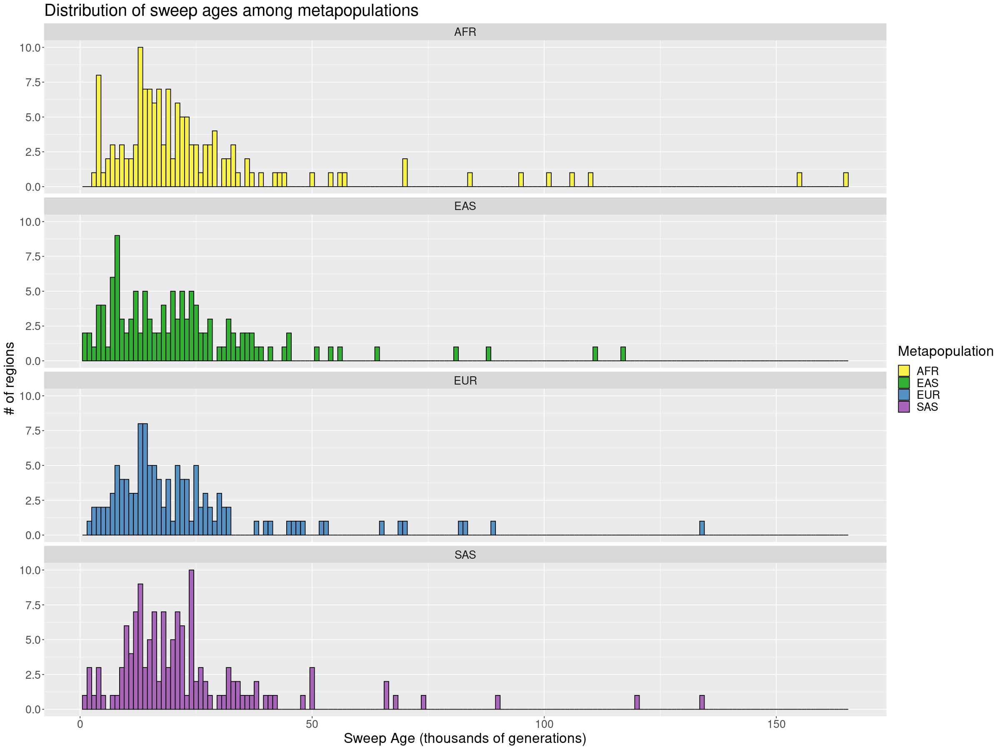

In [34]:
histogram_SweepAge_metapop(resultats_filtrats)

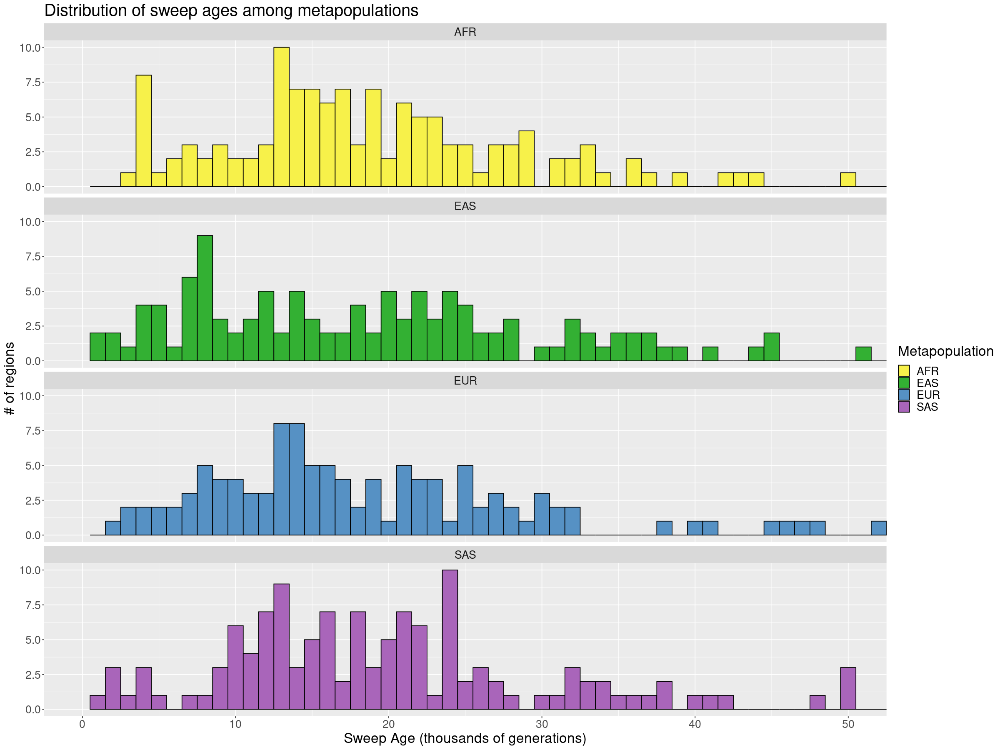

In [72]:
histogram_SweepAge_metapop(resultats_filtrats) + coord_cartesian(xlim = c(0, 50)) #El mateix gràfic però retallant només la part de l'esquerra

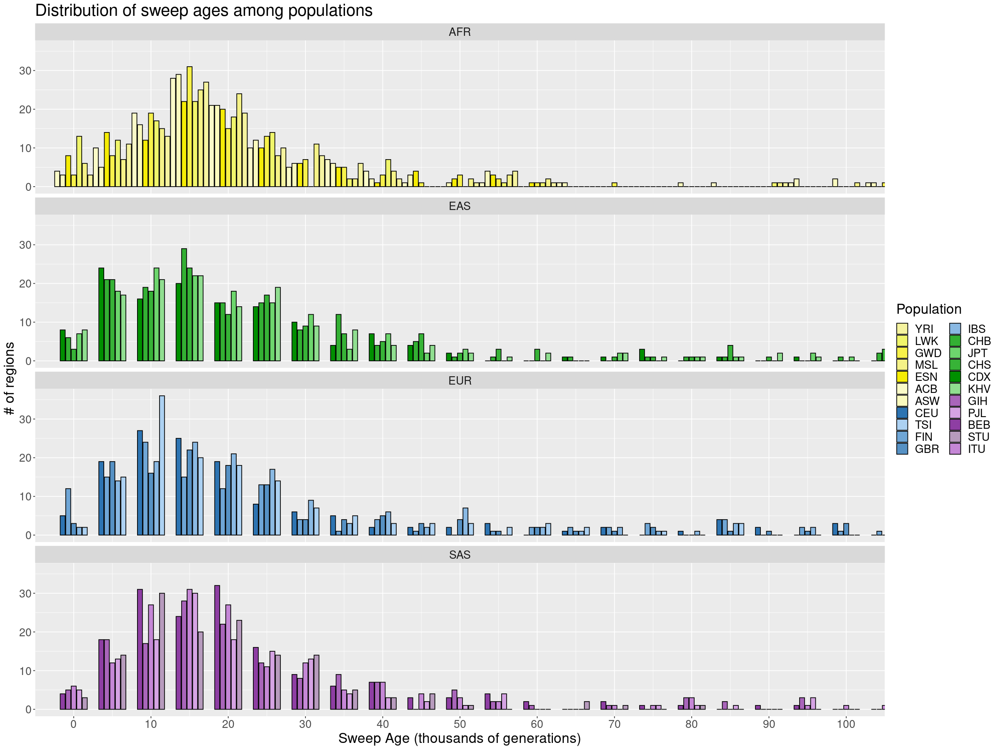

In [73]:
###HISTOGRAMA per representar les mitjanes estimades de les edats dels sweeps selectius per cada població dins de les metapoblacions
histogram_SweepAge_pop <- function(resultats_filtrats, pop_color = popPal[c(1:7, 12:26)],
                                   AFR = AFRpops, EAS = EASpops, EUR = EURpops, SAS = SASpops) {
    #Selecciono les columnes de les edats en poblacions, faig que cada edat passi a ser un registre  i filtro les NA
    resultats_filtrats <- resultats_filtrats %>% select(Region, ID, YRI_age_median,LWK_age_median,GWD_age_median,MSL_age_median,ESN_age_median,ACB_age_median,ASW_age_median,
                                                        CEU_age_median,TSI_age_median,FIN_age_median,GBR_age_median,IBS_age_median,CHB_age_median,JPT_age_median,CHS_age_median,
                                                        CDX_age_median,KHV_age_median,GIH_age_median,PJL_age_median,BEB_age_median,STU_age_median,ITU_age_median) %>%
        #Trec el suffix _age_median de les columnes que ho tenen perquedar-me amb la població i faig que cada regio/població sigui un registre i filtro les NA
        rename_with(~str_remove(., '_age_median')) %>% pivot_longer(cols = 'YRI':'ITU', names_to = 'pop', values_to = 'age_median') %>% filter(!is.na(age_median)) %>%
        #afegeixo la columna metapop amb les metapoblacions
        mutate(metapop = case_when(pop %in% AFR ~ 'AFR', pop %in% EUR ~ 'EUR', pop %in% EAS ~ 'EAS', pop %in% SAS ~ 'SAS'))
    #Ara represento l'histograma
    options(repr.plot.width = 20, repr.plot.height = 15, warn = 1)
    histogram <- resultats_filtrats %>% ggplot(mapping = aes(x = age_median/1000, fill = pop)) + geom_histogram(binwidth = 5, color = 'black', position = position_dodge2(preserve = "single")) +
        labs(x= 'Sweep Age (thousands of generations)', y = '# of regions', title = 'Distribution of sweep ages among populations') + 
        scale_fill_manual(values = pop_color, name = 'Population') + theme(text = element_text(size = 20)) +
        facet_wrap(~metapop, ncol = 1 ) + scale_x_continuous(breaks = c(0:33)*10)
    return(histogram)
}

histogram_SweepAge_pop(resultats_filtrats) + coord_cartesian(xlim = c(0, 100))

## Anàlisi de la variància entre variants significatives o no significatives per iSAFE

In [5]:
#Representació del nombre de regions on s'ha detectat un sweep selectiu que tenen diferències en la variància entre variants significatives i no per iSAFE
aohv_plot <- function(resultats_filtrats) {
    resultats_filtrats <- resultats_filtrats %>% select(Region, AFR_aoh, EUR_aoh, EAS_aoh, SAS_aoh, AFR_test, EUR_test, EAS_test, SAS_test) %>%
        pivot_longer(cols = 'AFR_aoh':'SAS_aoh', names_to = 'metapop_aoh', values_to = 'p_valor', values_drop_na = TRUE) %>%
        filter((metapop_aoh == 'AFR_aoh' & AFR_test != 'None' & AFR_test != 'Non-homogeneous' & AFR_test > 0.05) |
               (metapop_aoh == 'EUR_aoh' & EUR_test != 'None' & EUR_test != 'Non-homogeneous' & EUR_test > 0.05) |
               (metapop_aoh == 'EAS_aoh' & EAS_test != 'None' & EAS_test != 'Non-homogeneous' & EAS_test > 0.05) |
               (metapop_aoh == 'SAS_aoh' & SAS_test != 'None' & SAS_test != 'Non-homogeneous' & SAS_test > 0.05)) %>%
        mutate(significant = case_when(p_valor < 0.05 ~ '< 0.05', TRUE ~ '> 0.05'))
    options(repr.plot.width = 20, repr.plot.height = 7, warn = 1)
    grafic <- resultats_filtrats %>% ggplot(mapping = aes(x = significant, fill = metapop_aoh, color = significant)) + geom_bar() +
        labs(x= 'p-value of Levene test', y = '# of regions', title = 'Significance of Levene test for homogeneity of variance among metapopulations in filtered regions') + 
        scale_fill_manual(values = c('AFR_aoh' = "#F7F14A", 'EAS_aoh' = "#33B033", 'EUR_aoh' = "#5691C4", 'SAS_aoh' = "#A965BA"), name = 'Metapopulation', guide = 'none') +
        theme(text = element_text(size = 20)) + scale_color_manual(values = c('red', 'black')) +
        facet_grid(cols = vars(metapop_aoh), labeller = labeller(metapop_aoh = c('AFR_aoh' = 'AFR', 'EUR_aoh' = 'EUR', 'EAS_aoh' = 'EAS', 'SAS_aoh' = 'SAS')))
    return(grafic)
}

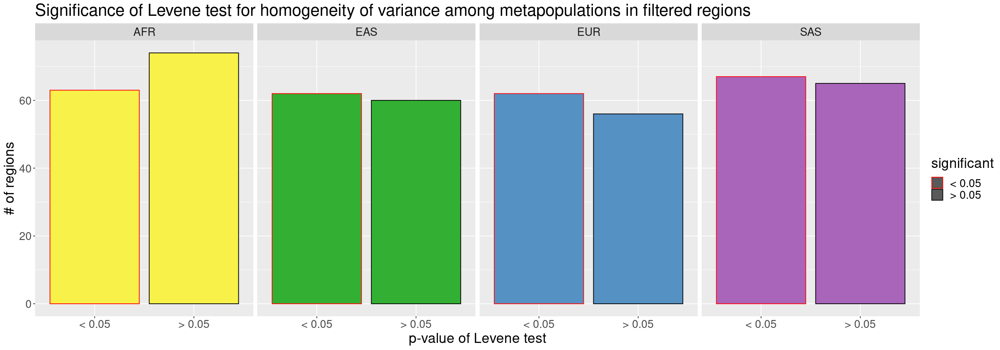

In [6]:
aohv_plot(resultats_filtrats)

# Resultats de PHS filtrats i diagrames de Venn

In [5]:
variantage_table_phs <- function(resultats_filtrats, PHS = phs, sign_level = 0.05) {
    #Em quedo només amb les regions detectades en anàlisis anteriors
    #Afegeixo la columna per les poblacions detectades
    #Defineixo el nivell se significància per l'ANOVA, a partir del qual es considera que les edats estimades entre les diferents poblacions no són significativament diferents
    PHS <- PHS %>% select(c("GeneID", "sweepGroup", "chr", "start", "end", "filterTime", "rawMetapopulation")) %>% filter(sweepGroup %in% resultats_filtrats$ID) %>%
        mutate(filtered_metapop = as.character(NA))
    #Itero sobre cada fila dels resultats
    for (n in 1:nrow(resultats_filtrats)) {
        region <- unlist(strsplit(resultats_filtrats$Region[n], ':'))
        chr <- as.numeric(region[1])
        start <- as.numeric(unlist(strsplit(region[2], '-'))[1])
        end <- as.numeric(unlist(strsplit(region[2], '-'))[2])
        #A pops, quines poblacions mostren un sweep selectiu en moments no significativament diferents per cada regió
        pops <- c()
        for (pop in c('AFR', 'EUR', 'EAS', 'SAS')) {
            columna <- paste0(pop, '_test')
            #Mirem les columnes dels resultats on es guarda un p_valor o bé un None o un NA
            valor <- resultats_filtrats[n, eval(as.symbol(columna))]
            #Si és un p-valor que és > 0.05, afegim aquesta població a pops
            if (is.na(valor) | valor == 'None' | valor == 'Non-homogeneous') {
                next
            } else if (as.numeric(valor) >= sign_level) {
                #Afegeixo la metapoblació al vector
                pops <- append(pops, pop)
            }
        }
        #Faig un str per afegir a la taula i afegeixo les metapoblacions corresponents
        PHS[n, "filtered_metapop"] <- paste(pops, collapse = ',')
    }
    return(PHS)
}

In [6]:
resultats_filtrats_phs <- variantage_table_phs(resultats_filtrats)
resultats_filtrats_phs

GeneID,sweepGroup,chr,start,end,filterTime,rawMetapopulation,filtered_metapop
<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,RecentSweep,AFR,SAS
SFPQ,34,chr1,35640204,35650204,"OldSweep,RecentSweep","EUR,AFR",SAS
ZMYM4,35,chr1,35780450,35886246,RecentSweep,SAS,"AFR,SAS"
nonCoding678,36,chr1,36107860,36144518,OldSweep,EUR,"EUR,EAS,SAS"
AGBL4,52,chr1,50209131,50395936,RecentSweep,"AFR,EAS","EUR,EAS"
C1orf185,54,chr1,51599043,51609043,OldSweep,EUR,"AFR,EAS,SAS"
EPS15,56,chr1,51833457,51866912,OldSweep,EAS,EUR
EPS15,58,chr1,51912548,51922548,OldSweep,EAS,EUR
CC2D1B,62,chr1,52817601,52827601,OldSweep,"EUR,AFR",EAS


In [92]:
library(VennDiagram)
#Funció per dibuixar el diagrama venn  de signatures a partirt de phs
venn_phs_signature <- function(PHS) {
    #Guardaré en un vector cada SweepGroup que mostri una determinada signatura, buscant una substring de filterTime amb grepl
    #LD correspon a RecentSweep, SFS correspon a MidSweep i OldSweep i MKT és Ancient
    LD <- PHS %>% filter(grepl('RecentSweep', filterTime, fixed = TRUE)) %>% pull(sweepGroup)
    SFS <- PHS %>% filter(grepl('OldSweep', filterTime, fixed = TRUE) | grepl('MidSweep', filterTime, fixed = TRUE)) %>% pull(sweepGroup)
    MKT <- PHS %>% filter(grepl('Ancient', filterTime, fixed = TRUE)) %>% pull(sweepGroup)
    #Així obtenim la llista de les regions per representar
    llista <- list(LD = LD, SFS = SFS, MKT = MKT)
    #Obtinc una taula amb les mides de les àrees a representar
    taula <- get.venn.partitions(llista, keep.elements = FALSE)
    #Construeixo el diagrama
    options(repr.plot.width = 10, repr.plot.height = 10, warn = 1)
    diagram <- draw.triple.venn(area1 = sum(taula %>% filter(LD == TRUE) %>% pull(..count..)), 
                                area2 = sum(taula %>% filter(SFS == TRUE) %>% pull(..count..)),
                                area3 = sum(taula %>% filter(MKT == TRUE) %>% pull(..count..)),
                                n12 = sum(taula %>% filter(LD == TRUE & SFS == TRUE) %>% pull(..count..)),
                                n23 = sum(taula %>% filter(MKT == TRUE & SFS == TRUE) %>% pull(..count..)),
                                n13 = sum(taula %>% filter(LD == TRUE & MKT == TRUE) %>% pull(..count..)),
                                n123 = sum(taula %>% filter(LD == TRUE & SFS == TRUE & MKT == TRUE) %>% pull(..count..)),
                                category = c('LD', 'SFS', 'Protein Changes'), euler.d = FALSE, scaled = FALSE,
                                fill = c("#33B033", "#5691C4", "#F7F14A"), lty = 'blank', alpha = 0.35, 
                                cex = 3, cat.cex = 3.5, cat.col = 'grey1', fontfamily = "sans", cat.fontfamily = "sans")
    return(diagram)
    
}

Loading required package: grid

Loading required package: futile.logger



(polygon[GRID.polygon.2690], polygon[GRID.polygon.2691], polygon[GRID.polygon.2692], polygon[GRID.polygon.2693], polygon[GRID.polygon.2694], polygon[GRID.polygon.2695], text[GRID.text.2696], text[GRID.text.2697], text[GRID.text.2698], text[GRID.text.2699], text[GRID.text.2700], text[GRID.text.2701], text[GRID.text.2702], text[GRID.text.2703], text[GRID.text.2704], text[GRID.text.2705]) 

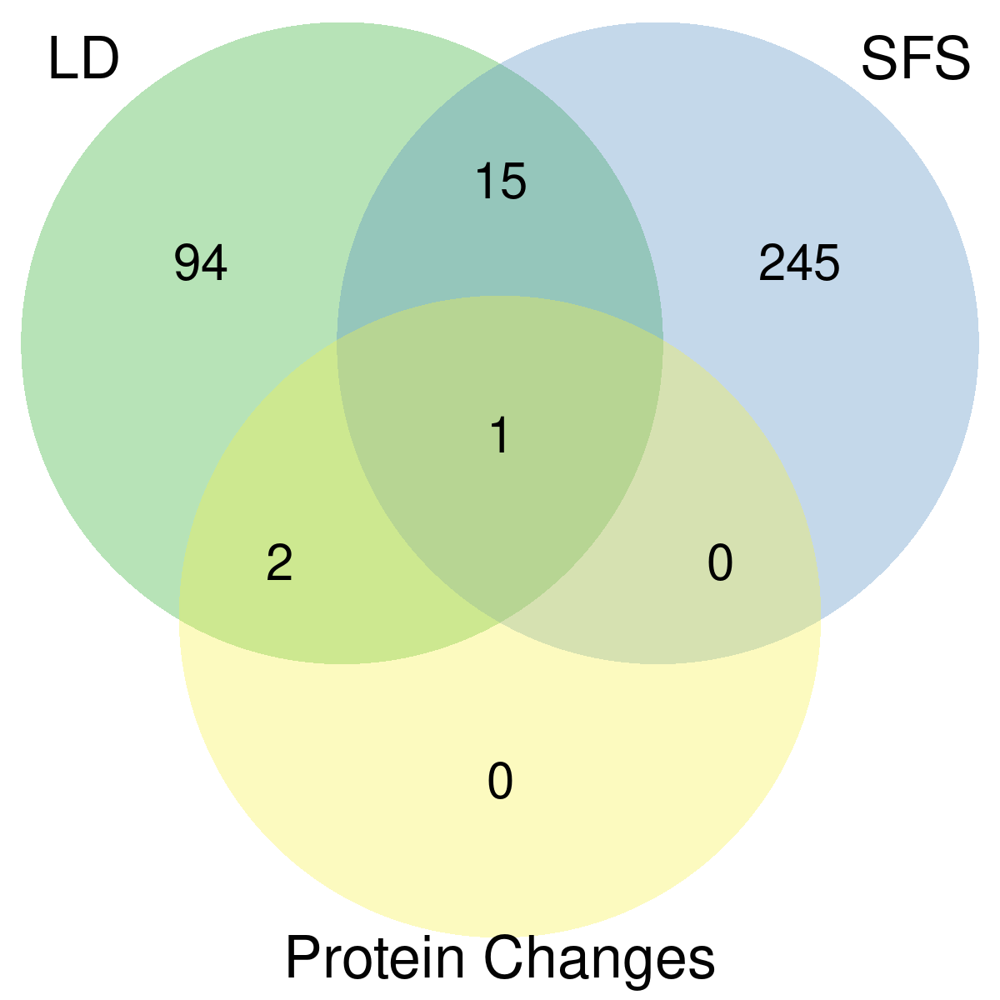

In [93]:
venn_phs_signature(resultats_filtrats_phs)

In [95]:
library(VennDiagram)
#Funció per dibuixar el diagrama venn de poblacions a partirt de phs
venn_phs_pops <- function(PHS, printing = 'raw') { #Posar c('raw', 'percent') a printing si volem obtenir també els percentatges
    #Guardaré en un vector cada SweepGroup que mostri una senyal per a cada metapoblació, buscant una substring de filterTime amb grepl
    llista <- list(AFR = c(), EUR = c(), EAS = c(), SAS = c())
    for (metapop in c('AFR', 'EUR', 'EAS', 'SAS')) {
        llista[[metapop]] <- PHS %>% filter(grepl(metapop, rawMetapopulation, fixed = TRUE)) %>% pull(sweepGroup)
    }
    #Faig la llista de les interseccions
    taula <- get.venn.partitions(llista, keep.elements = FALSE)
    #Ara que tinc la llista de les regions detectades per cada població, construeixo el diagrama
    options(repr.plot.width = 15, repr.plot.height = 15, warn = 1)
    draw.quad.venn(area1 = sum(taula %>% filter(AFR == TRUE) %>% pull(..count..)),
                   area2 = sum(taula %>% filter(EUR == TRUE) %>% pull(..count..)),
                   area3 = sum(taula %>% filter(EAS == TRUE) %>% pull(..count..)),
                   area4 = sum(taula %>% filter(SAS == TRUE) %>% pull(..count..)),
                   n12 = sum(taula %>% filter(AFR == TRUE & EUR == TRUE) %>% pull(..count..)),
                   n13 = sum(taula %>% filter(AFR == TRUE & EAS == TRUE) %>% pull(..count..)),
                   n14 = sum(taula %>% filter(AFR == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n23 = sum(taula %>% filter(EUR == TRUE & EAS == TRUE) %>% pull(..count..)),
                   n24 = sum(taula %>% filter(EUR == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n34 = sum(taula %>% filter(EAS == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n123 = sum(taula %>% filter(AFR == TRUE & EUR == TRUE & EAS == TRUE) %>% pull(..count..)),
                   n124 = sum(taula %>% filter(AFR == TRUE & EUR == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n134 = sum(taula %>% filter(AFR == TRUE & EAS == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n234 = sum(taula %>% filter(EUR == TRUE & EAS == TRUE & SAS == TRUE) %>% pull(..count..)),
                   n1234 = sum(taula %>% filter(AFR == TRUE & EUR == TRUE & EAS == TRUE & SAS == TRUE) %>% pull(..count..)),
                   category = c('AFR', 'EUR', 'EAS', 'SAS'), print.mode = printing,
                   fill = c("#F7F14A","#5691C4", "#33B033", "#A965BA"), lty = 'blank', alpha = 0.4, 
                   cex = 3, cat.cex = 3.5, cat.col = 'grey1', fontfamily = "sans", cat.fontfamily = "sans")
}

(polygon[GRID.polygon.2706], polygon[GRID.polygon.2707], polygon[GRID.polygon.2708], polygon[GRID.polygon.2709], polygon[GRID.polygon.2710], polygon[GRID.polygon.2711], polygon[GRID.polygon.2712], polygon[GRID.polygon.2713], text[GRID.text.2714], text[GRID.text.2715], text[GRID.text.2716], text[GRID.text.2717], text[GRID.text.2718], text[GRID.text.2719], text[GRID.text.2720], text[GRID.text.2721], text[GRID.text.2722], text[GRID.text.2723], text[GRID.text.2724], text[GRID.text.2725], text[GRID.text.2726], text[GRID.text.2727], text[GRID.text.2728], text[GRID.text.2729], text[GRID.text.2730], text[GRID.text.2731], text[GRID.text.2732]) 

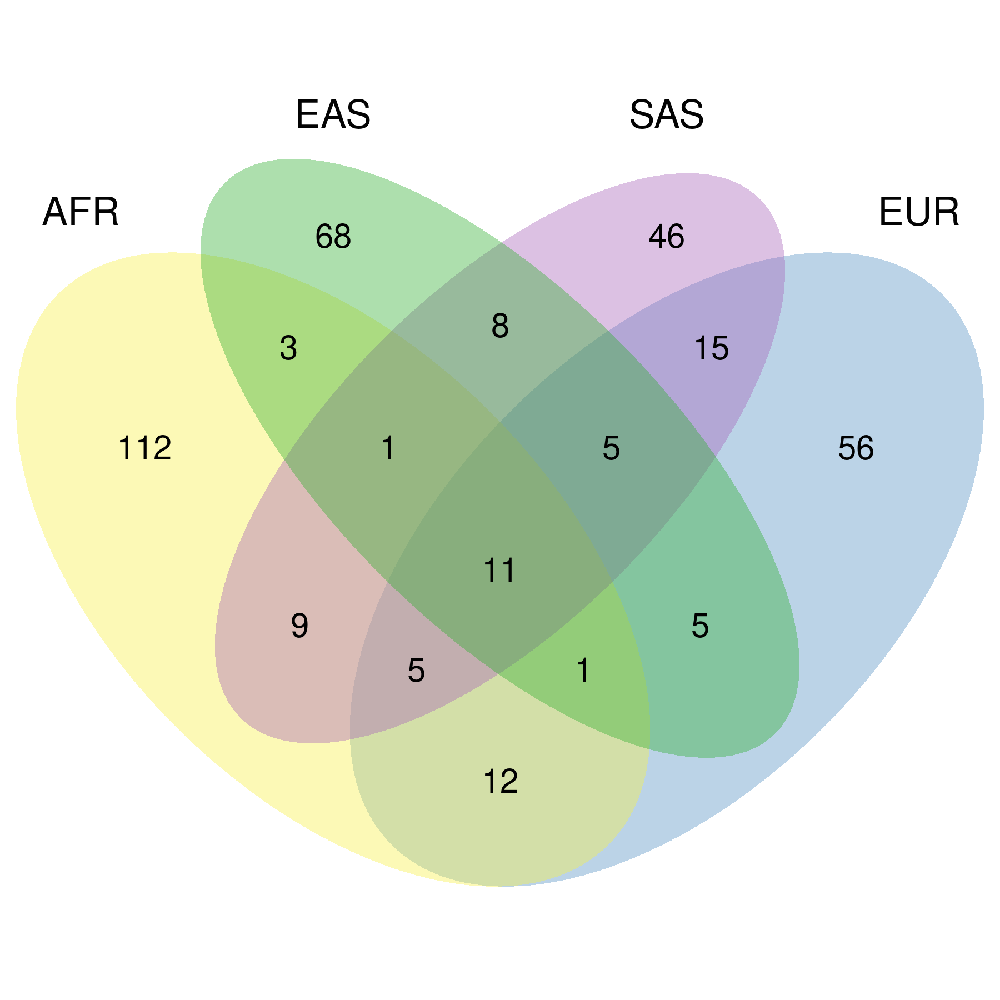

In [96]:
#Diagrama de Venn per les regions seleccionades amb l'anàlisi fet segons la/les metapoblació que s'ha detectat amb popHumanScan
venn_phs_pops(resultats_filtrats_phs)

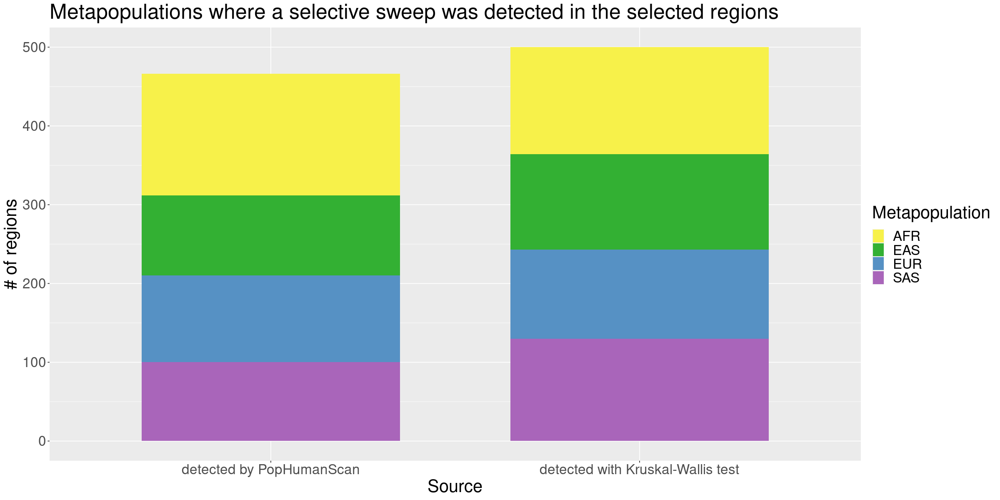

In [103]:
#Per les regions seleccionades, representació de les metapoblacions on PHS detecta selecció vs. les metapoblacions on hi ha un sweep selectiu sense diferències en una metapoblació
options(repr.plot.width = 20, repr.plot.height = 10, warn = 1)
taula_phs <- resultats_filtrats_phs %>% summarise(AFR = nrow(resultats_filtrats_phs %>% filter(grepl('AFR', rawMetapopulation, fixed = TRUE))),
                                              EUR = nrow(resultats_filtrats_phs %>% filter(grepl('EUR', rawMetapopulation, fixed = TRUE))),
                                              EAS = nrow(resultats_filtrats_phs %>% filter(grepl('EAS', rawMetapopulation, fixed = TRUE))),
                                              SAS = nrow(resultats_filtrats_phs %>% filter(grepl('SAS', rawMetapopulation, fixed = TRUE)))) %>% 
    pivot_longer(cols = 1:4, names_to = 'metapop', values_to = 'count') %>% mutate(font = 'phs')
taula_filter <- resultats_filtrats_phs %>% summarise(AFR = nrow(resultats_filtrats_phs %>% filter(grepl('AFR', filtered_metapop, fixed = TRUE))),
                                                     EUR = nrow(resultats_filtrats_phs %>% filter(grepl('EUR', filtered_metapop, fixed = TRUE))),
                                                     EAS = nrow(resultats_filtrats_phs %>% filter(grepl('EAS', filtered_metapop, fixed = TRUE))),
                                                     SAS = nrow(resultats_filtrats_phs %>% filter(grepl('SAS', filtered_metapop, fixed = TRUE)))) %>%
    pivot_longer(cols = 1:4, names_to = 'metapop', values_to = 'count') %>% mutate(font = 'filter')
taula <- rbind(taula_phs, taula_filter)
taula %>% ggplot(mapping = aes(x = font, y = count, fill = metapop, stat = 'identity')) + geom_col(width = 0.7, show.legend = TRUE) +
    labs(x= 'Source', y = '# of regions', title = 'Metapopulations where a selective sweep was detected in the selected regions') +
    scale_x_discrete(limits = c('phs', 'filter'), labels = c('detected by PopHumanScan', 'detected with Kruskal-Wallis test')) +
    theme(text = element_text(size = 25)) + scale_fill_manual(values = c("#F7F14A","#33B033", "#5691C4", "#A965BA"), name = 'Metapopulation')

# PHS pels resultats descartats, diagrama de Venn i causes

In [71]:
#Aquesta funció serveix per filtrar les regions que NO se seleccionen amb l'anàlisi 
variantage_table_discarded <- function(resultats, resultats_filtrats, PHS = phs) {
    #Em quedo amb les regions que no es trobin a la taula filtrada
    PHS <- PHS %>% select(c("GeneID", "sweepGroup", "chr", "start", "end", "filterTime", "rawMetapopulation")) %>% filter(!sweepGroup %in% resultats_filtrats$ID) %>%
    #Afegeixo la columna causa
        mutate(Cause = resultats %>% filter(!ID %in% resultats_filtrats$ID) %>% pull(Cause))
    #Els valors NA de Cause (són els que sí que tenen variants significatives però o no es pot fer ANOVA o mostra diferències significatives) els canvio
    for (n in 1:nrow(PHS)) {
        if (is.na(PHS$Cause[n])) {
            id <- PHS$sweepGroup[n]
            taula <- resultats[ID == id, c('AFR_test','EUR_test','EAS_test','SAS_test')]
            #Miro si les 4 columnes tenen valors NA o None, que no s'ha fet cap ANOVA
            if (all(is.na(taula) | taula == 'None')) {
                PHS$Cause[n] <- 'No test'
            } else if (all(is.na(taula) | taula == 'None' | taula == "Non-homogeneous")) {
                #En aquest cas, significa que no s'ha fet cap test, i les metapoblacions que en podrien haver fet, no podien per l'heterogeneitat de les variancies
                PHS$Cause[n] <- 'Non-homogeneous'
            } else {
                #Si no és el segon cas, singnifica que s'ha pogut fer algun ANOVA pero que ha donat significatiu
                PHS$Cause[n] <- 'Kruskal signif'
            }
        }
    }
    return(PHS)
}

In [72]:
discarded_phs <- variantage_table_discarded(resultats, resultats_filtrats)
discarded_phs

GeneID,sweepGroup,chr,start,end,filterTime,rawMetapopulation,Cause
<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
AURKAIP1,1,chr1,1292163,1313595,MidSweep,EAS,No variants
PRDM16,2,chr1,3121765,3166685,RecentSweep,EUR,N.S.
nonCoding26,3,chr1,4092100,4102100,MidSweep,AFR,N.S.
ACOT7,4,chr1,6430570,6499187,RecentSweep,SAS,N.S.
VPS13D,5,chr1,12315944,12335944,OldSweep,EUR,N.S.
VPS13D,6,chr1,12352531,12372531,OldSweep,EUR,N.S.
nonCoding240,7,chr1,12861992,12871992,"OldSweep,RecentSweep","AFR,SAS,EAS",No variants
KAZN,8,chr1,14418659,14428659,OldSweep,EAS,N.S.
MUL1,9,chr1,20822948,20842948,MidSweep,AFR,N.S.


(polygon[GRID.polygon.2733], polygon[GRID.polygon.2734], polygon[GRID.polygon.2735], polygon[GRID.polygon.2736], polygon[GRID.polygon.2737], polygon[GRID.polygon.2738], polygon[GRID.polygon.2739], polygon[GRID.polygon.2740], text[GRID.text.2741], text[GRID.text.2742], text[GRID.text.2743], text[GRID.text.2744], text[GRID.text.2745], text[GRID.text.2746], text[GRID.text.2747], text[GRID.text.2748], text[GRID.text.2749], text[GRID.text.2750], text[GRID.text.2751], text[GRID.text.2752], text[GRID.text.2753], text[GRID.text.2754], text[GRID.text.2755], text[GRID.text.2756], text[GRID.text.2757], text[GRID.text.2758], text[GRID.text.2759]) 

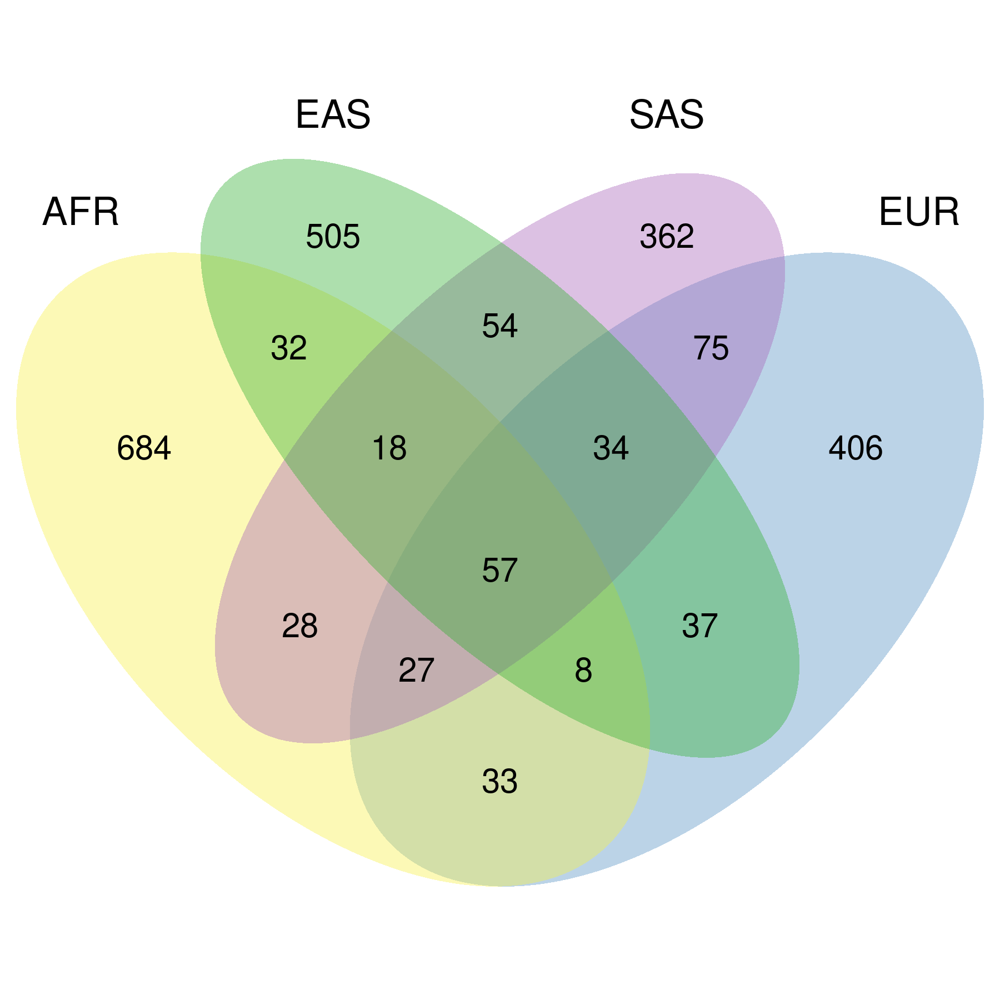

In [100]:
#Diagrama de Venn per les regions descartades amb l'anàlisi fet segons la/les metapoblació que s'ha detectat amb popHumanScan
venn_phs_pops(discarded_phs)

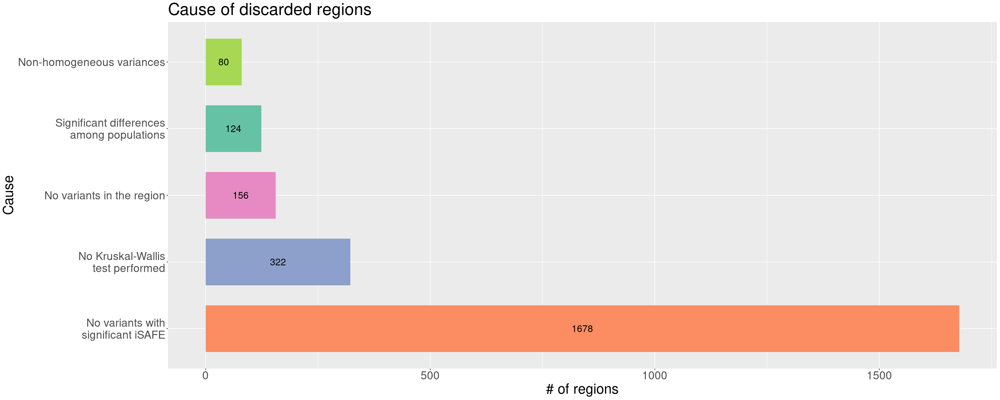

In [102]:
#Representació de les causes per les quals es descarten les altres regions de PHS en l'anàlisi
options(repr.plot.width = 25, repr.plot.height = 10, warn = 1)
discarded_phs %>% ggplot(mapping = aes(y = Cause, fill = Cause)) + geom_bar(width = 0.7, show.legend = FALSE) +
    labs(x= '# of regions', y = 'Cause', title = 'Cause of discarded regions') + 
    theme(text = element_text(size = 25)) + scale_y_discrete(labels= c("No variants" = "No variants in the region", "No test" = "No Kruskal-Wallis\n test performed",
                                                                       "N.S." = "No variants with\nsignificant iSAFE", "Kruskal signif" = "Significant differences\namong populations",
                                                                       "Non-homogeneous" = "Non-homogeneous variances"),
                                                            limits = c("N.S.","No test","No variants", "Kruskal signif", "Non-homogeneous")) +
    stat_count(geom = "text", colour = "black", size = 6, aes(label = ..count..),position=position_stack(vjust=0.5)) + scale_fill_brewer(palette="Set2")

# Anàlisi d'iHS i nSL de les regions analitzades

## iHS

### Text

In [104]:
#Afegiré a les taules la informació de ihs de la regió: iHS màxim i mínim i el nombre de variants amb la regió amb iHS >2 o <2 per comparar entre regions seleccionades o no

#Aquesta funció farà un histograma de la distribució dels valors d'iHS per comparar entre regions seleccionades o no amb l'anàlisi 
perfil_ihs <- function(taula, threshold_ihs = 2,
                       AFR = AFRpops, EAS = EASpops, EUR = EURpops, SAS = SASpops) {
    #Afegeixo a la taula columnes per guardar tota la informació necessària: 4 columnes per població
    taula <- taula %>% select(GeneID, sweepGroup, chr, start, end, Cause) %>% 
        mutate('ACB__max_ihs' = as.numeric(NA), 'ASW__max_ihs' = as.numeric(NA), 'ESN__max_ihs' = as.numeric(NA), 'GWD__max_ihs' = as.numeric(NA),
               'LWK__max_ihs' = as.numeric(NA), 'MSL__max_ihs' = as.numeric(NA), 'YRI__max_ihs' = as.numeric(NA), 'CDX__max_ihs' = as.numeric(NA),
               'CHB__max_ihs' = as.numeric(NA), 'CHS__max_ihs' = as.numeric(NA), 'JPT__max_ihs' = as.numeric(NA), 'KHV__max_ihs' = as.numeric(NA), 
               'CEU__max_ihs' = as.numeric(NA), 'FIN__max_ihs' = as.numeric(NA), 'GBR__max_ihs' = as.numeric(NA), 'IBS__max_ihs' = as.numeric(NA),
               'TSI__max_ihs' = as.numeric(NA), 'BEB__max_ihs' = as.numeric(NA), 'GIH__max_ihs' = as.numeric(NA), 'ITU__max_ihs' = as.numeric(NA),
               'PJL__max_ihs' = as.numeric(NA), 'STU__max_ihs' = as.numeric(NA), 'ACB__min_ihs' = as.numeric(NA), 'ASW__min_ihs' = as.numeric(NA),
               'ESN__min_ihs' = as.numeric(NA), 'GWD__min_ihs' = as.numeric(NA), 'LWK__min_ihs' = as.numeric(NA), 'MSL__min_ihs' = as.numeric(NA),
               'YRI__min_ihs' = as.numeric(NA), 'CDX__min_ihs' = as.numeric(NA), 'CHB__min_ihs' = as.numeric(NA), 'CHS__min_ihs' = as.numeric(NA),
               'JPT__min_ihs' = as.numeric(NA), 'KHV__min_ihs' = as.numeric(NA), 'CEU__min_ihs' = as.numeric(NA), 'FIN__min_ihs' = as.numeric(NA),
               'GBR__min_ihs' = as.numeric(NA), 'IBS__min_ihs' = as.numeric(NA), 'TSI__min_ihs' = as.numeric(NA), 'BEB__min_ihs' = as.numeric(NA),
               'GIH__min_ihs' = as.numeric(NA), 'ITU__min_ihs' = as.numeric(NA), 'PJL__min_ihs' = as.numeric(NA), 'STU__min_ihs' = as.numeric(NA),
               'ACB__npos_ihs' = as.numeric(NA), 'ASW__npos_ihs' = as.numeric(NA), 'ESN__npos_ihs' = as.numeric(NA), 'GWD__npos_ihs' = as.numeric(NA),
               'LWK__npos_ihs' = as.numeric(NA), 'MSL__npos_ihs' = as.numeric(NA), 'YRI__npos_ihs' = as.numeric(NA), 'CDX__npos_ihs' = as.numeric(NA),
               'CHB__npos_ihs' = as.numeric(NA), 'CHS__npos_ihs' = as.numeric(NA), 'JPT__npos_ihs' = as.numeric(NA), 'KHV__npos_ihs' = as.numeric(NA), 
               'CEU__npos_ihs' = as.numeric(NA), 'FIN__npos_ihs' = as.numeric(NA), 'GBR__npos_ihs' = as.numeric(NA), 'IBS__npos_ihs' = as.numeric(NA),
               'TSI__npos_ihs' = as.numeric(NA), 'BEB__npos_ihs' = as.numeric(NA), 'GIH__npos_ihs' = as.numeric(NA), 'ITU__npos_ihs' = as.numeric(NA),
               'PJL__npos_ihs' = as.numeric(NA), 'STU__npos_ihs' = as.numeric(NA), 'ACB__nneg_ihs' = as.numeric(NA), 'ASW__nneg_ihs' = as.numeric(NA),
               'ESN__nneg_ihs' = as.numeric(NA), 'GWD__nneg_ihs' = as.numeric(NA), 'LWK__nneg_ihs' = as.numeric(NA), 'MSL__nneg_ihs' = as.numeric(NA),
               'YRI__nneg_ihs' = as.numeric(NA), 'CDX__nneg_ihs' = as.numeric(NA), 'CHB__nneg_ihs' = as.numeric(NA), 'CHS__nneg_ihs' = as.numeric(NA),
               'JPT__nneg_ihs' = as.numeric(NA), 'KHV__nneg_ihs' = as.numeric(NA), 'CEU__nneg_ihs' = as.numeric(NA), 'FIN__nneg_ihs' = as.numeric(NA),
               'GBR__nneg_ihs' = as.numeric(NA), 'IBS__nneg_ihs' = as.numeric(NA), 'TSI__nneg_ihs' = as.numeric(NA), 'BEB__nneg_ihs' = as.numeric(NA),
               'GIH__nneg_ihs' = as.numeric(NA), 'ITU__nneg_ihs' = as.numeric(NA), 'PJL__nneg_ihs' = as.numeric(NA), 'STU__nneg_ihs' = as.numeric(NA))
    #Per cada regió, calcularem els valors mitjans d'iHS de les poblacions que es pugui
    for (n in 1:nrow(taula)) {
        chr <- gsub('chr', '', taula$chr[n])
        inici <- taula$start[n]
        final <- taula$end[n]
        #Obtinc la taula d'iHS per les variants de la regió
        iHS <- sqlToDf(chr, inici, final, 'ihs')
        #Si no hi hagués cap variant, ho deixo tot en NA i passo a la següent iteració (potser hauria de posar 0 a les npos i nneg però no sé)
        if (nrow(iHS) == 0) {
            next
        }
        #Si hi ha variants, faig un pivot_longer per tenir cada variant de cada població en un registre i elimino els valors NA
        iHS <- iHS %>% pivot_longer(cols = 'ACB':'YRI', names_to = 'pop', values_to = 'ihs') %>% filter(!is.na(ihs)) %>%
            #llavors, elimino les poblacions americanes, agrupo per població i en calculo el mínim, màxim i el nombre de variants que superin els valors límits 
            filter(!pop %in% c('CLM', 'MXL', 'PEL', 'PUR')) %>% group_by(pop) %>% summarise(max_ihs = max(ihs), min_ihs = min(ihs),
                                                                                            npos_ihs = sum(ihs >= threshold_ihs), nneg_ihs = sum(ihs <= - threshold_ihs), .groups = 'drop')
        #Ara he de guardar cadascun dels 4 valors a la taula principal a la població corresponent
        for (p in 1:nrow(iHS)) {
            pop_ihs <- iHS$pop[p]
            #Per cada fila, he de guardar els 4 valors:
            for (valor in c('max_ihs', 'min_ihs', 'npos_ihs', 'nneg_ihs')) {
                columna <- paste(pop_ihs, valor, sep='__')
                taula[n, columna] <- iHS[p, valor]
            }
        }
        #Ara ja tenim les dades d'iHS per cada població que es pot da la taula principal
    }
    #Faig un pivot longer per tenir cada població i regió (i dada) en un registre i filtro les files on no hi hagi cap dada d'iHS en aquella població i regió
    #Pero realment el que m'interessa és tenir 4 columnes per les dades i cada poblacioó en una fila. Separaré en 2 columnes pop.data
    taula <- taula %>% pivot_longer(cols = 'ACB__max_ihs':'STU__nneg_ihs', names_to = 'pop_data', values_to = 'valor') %>% filter(!is.na(valor)) %>%
        separate(pop_data, sep = "__", into = c("pop", "data")) %>% 
        #Llavors faig un pivot_wider per tenir cada dada en una columna i un registre per regió i població; i afegeixo la columna metapop per saber a quina metapoblació es correspon
        # i afegeixo una columna que miri si se seleccionen més els al·lels derivats (npos_ihs>nneg:ihs) o els ancestrals (npos_ihs < nneg_ihs)
        pivot_wider(names_from = data, values_from = valor) %>% mutate(metapop = case_when(pop %in% AFR ~ 'AFR', pop %in% EUR ~ 'EUR', pop %in% EAS ~ 'EAS', pop %in% SAS ~ 'SAS', TRUE ~ 'AMR'),
                                                                       selected_alleles = as.character(NA))
    for (n in 1:nrow(taula)) {
        if (taula[n, 'npos_ihs'] > taula[n, 'nneg_ihs']) {
            taula[n, 'selected_alleles'] <- 'Derived'
        } else if (taula[n, 'npos_ihs'] < taula[n, 'nneg_ihs']) {
            taula[n, 'selected_alleles'] <- 'Ancestral'
        } else if (taula[n, 'npos_ihs'] == 0) {
            taula[n, 'selected_alleles'] <- 'None'
        }
    }
    return(taula)
}

In [105]:
ihs_filtrats <- perfil_ihs(resultats_filtrats_phs %>% mutate(Cause = 0))
ihs_filtrats

GeneID,sweepGroup,chr,start,end,Cause,pop,max_ihs,min_ihs,npos_ihs,nneg_ihs,metapop,selected_alleles
<chr>,<int>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ACB,1.8691500,-2.234640,0,5,AFR,Ancestral
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ASW,2.0653200,-2.467720,6,6,AFR,NA
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ESN,2.8977300,-1.038970,3,0,AFR,Derived
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,GWD,1.8818800,-1.238030,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,LWK,2.3836600,-1.844150,4,0,AFR,Derived
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,MSL,1.7978100,-2.062440,0,4,AFR,Ancestral
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,YRI,2.0532900,-1.898790,1,0,AFR,Derived
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,CDX,1.9826000,-1.021500,0,0,EAS,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,CHB,0.7025790,-1.591530,0,0,EAS,None


In [106]:
ihs_discarded <- perfil_ihs(discarded_phs)
ihs_discarded

GeneID,sweepGroup,chr,start,end,Cause,pop,max_ihs,min_ihs,npos_ihs,nneg_ihs,metapop,selected_alleles
<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AURKAIP1,1,chr1,1292163,1313595,No variants,ACB,2.53786,-3.01278,8,15,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,ASW,3.19966,-4.17267,8,16,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,ESN,2.40077,-2.88627,6,11,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,GWD,2.22111,-2.76019,3,14,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,LWK,1.88734,-2.79827,0,8,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,MSL,1.98794,-2.57606,0,1,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,YRI,2.09947,-2.49355,1,13,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,CDX,5.58239,-4.31784,58,36,EAS,Derived
AURKAIP1,1,chr1,1292163,1313595,No variants,CHB,4.25580,-3.32790,13,8,EAS,Derived


In [108]:
write.csv(ihs_discarded,'/home/anoguera/Data/ihs_discarded.csv', row.names = FALSE)

In [109]:
ihs_discarded <- fread('/home/anoguera/Data/ihs_discarded.csv')

In [110]:
cat("- Valor màxim d'iHS\n")
print(summary(ihs_filtrats$max_ihs))
cat("- Valor mínim d'iHS\n")
print(summary(ihs_filtrats$min_ihs))
cat("- Nombre de variants amb iHS > 2\n")
print(summary(ihs_filtrats$npos_ihs))
cat("- Nombre de variants amb iHS < 2\n")
print(summary(ihs_filtrats$nneg_ihs))
cat("- Al·lels seleccionats\n")
print(ihs_filtrats %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(ihs_filtrats)*100, .groups = 'drop'))

- Valor màxim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -2.321   1.099   1.664   1.795   2.389  10.883 
- Valor mínim d'iHS
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-10.4944  -2.1963  -1.5236  -1.6516  -0.9354   3.5887 
- Nombre de variants amb iHS > 2
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   0.000    0.000    0.000    9.114    2.000 1418.000 
- Nombre de variants amb iHS < 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    0.00    0.00   10.56    1.00 2194.00 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          17.9 
2 Derived            24.9 
3 None               55.2 
4 NA                  1.91


In [111]:
cat("- Valor màxim d'iHS\n")
print(summary(ihs_discarded$max_ihs))
cat("- Valor mínim d'iHS\n")
print(summary(ihs_discarded$min_ihs))
cat("- Nombre de variants amb iHS > 2\n")
print(summary(ihs_discarded$npos_ihs))
cat("- Nombre de variants amb iHS < 2\n")
print(summary(ihs_discarded$nneg_ihs))
cat("- Al·lels seleccionats\n")
print(ihs_discarded %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(ihs_discarded)*100, .groups = 'drop'))

- Valor màxim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.6399  0.8638  1.3630  1.4126  1.9186  8.1973 
- Valor mínim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-8.9075 -1.9991 -1.4240 -1.4807 -0.9026  3.3843 
- Nombre de variants amb iHS > 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   2.589   0.000 657.000 
- Nombre de variants amb iHS < 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   3.172   0.000 808.000 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          17.8 
2 Derived            13.8 
3 None               66.9 
4 NA                  1.46


In [112]:
for (causa in unique(ihs_discarded$Cause)) {
    ihs_temp <- ihs_discarded %>% filter(Cause == causa)
    cat('\nCAUSA: ', causa, '\n')
    cat("- Valor màxim d'iHS\n")
    print(summary(ihs_temp$max_ihs))
    cat("- Valor mínim d'iHS\n")
    print(summary(ihs_temp$min_ihs))
    cat("- Nombre de variants amb iHS > 2\n")
    print(summary(ihs_temp$npos_ihs))
    cat("- Nombre de variants amb iHS < 2\n")
    print(summary(ihs_temp$nneg_ihs))
    cat("- Al·lels seleccionats\n")
    print(ihs_temp %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(ihs_temp)*100, .groups = 'drop'))
    rm(ihs_temp)
}


CAUSA:  No variants 
- Valor màxim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-2.2912  0.9033  1.5218  1.6553  2.2503  8.1973 
- Valor mínim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -8.179  -2.603  -1.903  -2.057  -1.331   2.065 
- Nombre de variants amb iHS > 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    0.00    0.00   10.24    2.00  657.00 
- Nombre de variants amb iHS < 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     0.0     0.0    14.8     5.0   808.0 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          36.9 
2 Derived            11.4 
3 None               50.2 
4 NA                  1.52

CAUSA:  N.S. 
- Valor màxim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.6399  0.8271  1.3156  1.3375  1.8365  7.7366 
- Valor mínim d'iHS
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-8.9075 -1.9412 -1.3938 -1.4296 -0.8881  2.7066 
- Nombre de variants amb i

### Imatge

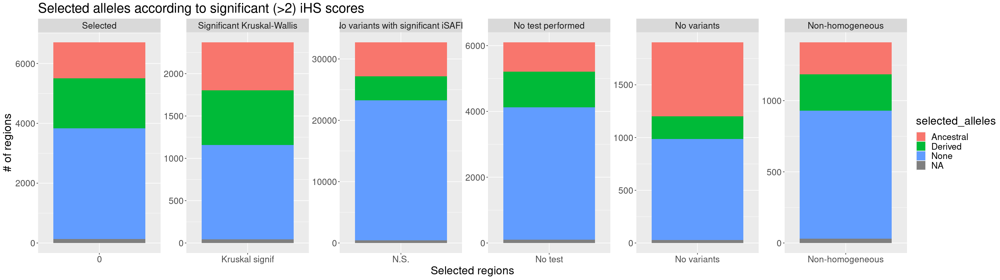

In [113]:
#Ara ja es pot representar l'histograma, amb aquestes dades
#Ajunto les dos taules, afegint abans una columna que diferencii de quina venien
taula <- rbind(ihs_filtrats, ihs_discarded) 
options(repr.plot.width = 25, repr.plot.height = 7, warn = 1)
grafic <- taula %>% ggplot(mapping = aes(x = Cause, fill = selected_alleles)) + geom_bar() + 
    labs(x= 'Selected regions', y = '# of regions', title = 'Selected alleles according to significant (>2) iHS scores') +
    facet_wrap(~ Cause, ncol = 6,  scales = 'free', labeller = labeller(Cause = c('0' = 'Selected', 'Kruskal signif' = 'Significant Kruskal-Wallis', 'N.S.' = 'No variants with significant iSAFE', 
                                                                                 'No test' = 'No test performed', 'No variants' = 'No variants', 'Non-homogeneous' = 'Non-homogeneous'))) +
    theme(text = element_text(size = 20))
    #scale_fill_manual(values = metapopsData$colors, name = 'Population')  +
    #Faig servir facet_grid2 de ggh4x perquè deixa 'alliberar' l'eix y, mentre que facet_grid normal no deixa que canviï en una mateixa fila, que és el que necessito (amb l'argument independent)
grafic

## nSL

### Text

In [114]:
#Afegiré a les taules la informació de nsl de la regió: nSL màxim i mínim i el nombre de variants amb la regió amb nSL >2 o <2 per comparar entre regions seleccionades o no

#Aquesta funció farà un histograma de la distribució dels valors d'nSL per comparar entre regions seleccionades o no amb l'anàlisi 
perfil_nsl <- function(taula, threshold_nsl = 2,
                       AFR = AFRpops, EAS = EASpops, EUR = EURpops, SAS = SASpops) {
    #Afegeixo a la taula columnes per guardar tota la informació necessària: 4 columnes per població
    taula <- taula %>% select(GeneID, sweepGroup, chr, start, end, Cause) %>% 
        mutate('ACB__max_nsl' = as.numeric(NA), 'ASW__max_nsl' = as.numeric(NA), 'ESN__max_nsl' = as.numeric(NA), 'GWD__max_nsl' = as.numeric(NA),
               'LWK__max_nsl' = as.numeric(NA), 'MSL__max_nsl' = as.numeric(NA), 'YRI__max_nsl' = as.numeric(NA), 'CDX__max_nsl' = as.numeric(NA),
               'CHB__max_nsl' = as.numeric(NA), 'CHS__max_nsl' = as.numeric(NA), 'JPT__max_nsl' = as.numeric(NA), 'KHV__max_nsl' = as.numeric(NA), 
               'CEU__max_nsl' = as.numeric(NA), 'FIN__max_nsl' = as.numeric(NA), 'GBR__max_nsl' = as.numeric(NA), 'IBS__max_nsl' = as.numeric(NA),
               'TSI__max_nsl' = as.numeric(NA), 'BEB__max_nsl' = as.numeric(NA), 'GIH__max_nsl' = as.numeric(NA), 'ITU__max_nsl' = as.numeric(NA),
               'PJL__max_nsl' = as.numeric(NA), 'STU__max_nsl' = as.numeric(NA), 'ACB__min_nsl' = as.numeric(NA), 'ASW__min_nsl' = as.numeric(NA),
               'ESN__min_nsl' = as.numeric(NA), 'GWD__min_nsl' = as.numeric(NA), 'LWK__min_nsl' = as.numeric(NA), 'MSL__min_nsl' = as.numeric(NA),
               'YRI__min_nsl' = as.numeric(NA), 'CDX__min_nsl' = as.numeric(NA), 'CHB__min_nsl' = as.numeric(NA), 'CHS__min_nsl' = as.numeric(NA),
               'JPT__min_nsl' = as.numeric(NA), 'KHV__min_nsl' = as.numeric(NA), 'CEU__min_nsl' = as.numeric(NA), 'FIN__min_nsl' = as.numeric(NA),
               'GBR__min_nsl' = as.numeric(NA), 'IBS__min_nsl' = as.numeric(NA), 'TSI__min_nsl' = as.numeric(NA), 'BEB__min_nsl' = as.numeric(NA),
               'GIH__min_nsl' = as.numeric(NA), 'ITU__min_nsl' = as.numeric(NA), 'PJL__min_nsl' = as.numeric(NA), 'STU__min_nsl' = as.numeric(NA),
               'ACB__npos_nsl' = as.numeric(NA), 'ASW__npos_nsl' = as.numeric(NA), 'ESN__npos_nsl' = as.numeric(NA), 'GWD__npos_nsl' = as.numeric(NA),
               'LWK__npos_nsl' = as.numeric(NA), 'MSL__npos_nsl' = as.numeric(NA), 'YRI__npos_nsl' = as.numeric(NA), 'CDX__npos_nsl' = as.numeric(NA),
               'CHB__npos_nsl' = as.numeric(NA), 'CHS__npos_nsl' = as.numeric(NA), 'JPT__npos_nsl' = as.numeric(NA), 'KHV__npos_nsl' = as.numeric(NA), 
               'CEU__npos_nsl' = as.numeric(NA), 'FIN__npos_nsl' = as.numeric(NA), 'GBR__npos_nsl' = as.numeric(NA), 'IBS__npos_nsl' = as.numeric(NA),
               'TSI__npos_nsl' = as.numeric(NA), 'BEB__npos_nsl' = as.numeric(NA), 'GIH__npos_nsl' = as.numeric(NA), 'ITU__npos_nsl' = as.numeric(NA),
               'PJL__npos_nsl' = as.numeric(NA), 'STU__npos_nsl' = as.numeric(NA), 'ACB__nneg_nsl' = as.numeric(NA), 'ASW__nneg_nsl' = as.numeric(NA),
               'ESN__nneg_nsl' = as.numeric(NA), 'GWD__nneg_nsl' = as.numeric(NA), 'LWK__nneg_nsl' = as.numeric(NA), 'MSL__nneg_nsl' = as.numeric(NA),
               'YRI__nneg_nsl' = as.numeric(NA), 'CDX__nneg_nsl' = as.numeric(NA), 'CHB__nneg_nsl' = as.numeric(NA), 'CHS__nneg_nsl' = as.numeric(NA),
               'JPT__nneg_nsl' = as.numeric(NA), 'KHV__nneg_nsl' = as.numeric(NA), 'CEU__nneg_nsl' = as.numeric(NA), 'FIN__nneg_nsl' = as.numeric(NA),
               'GBR__nneg_nsl' = as.numeric(NA), 'IBS__nneg_nsl' = as.numeric(NA), 'TSI__nneg_nsl' = as.numeric(NA), 'BEB__nneg_nsl' = as.numeric(NA),
               'GIH__nneg_nsl' = as.numeric(NA), 'ITU__nneg_nsl' = as.numeric(NA), 'PJL__nneg_nsl' = as.numeric(NA), 'STU__nneg_nsl' = as.numeric(NA))
    #Per cada regió, calcularem els valors mitjans d'sS de les poblacions que es pugui
    for (n in 1:nrow(taula)) {
        chr <- gsub('chr', '', taula$chr[n])
        inici <- taula$start[n]
        final <- taula$end[n]
        #Obtinc la taula d'nSL per les variants de la regió
        nSL <- sqlToDf(chr, inici, final, 'nsl')
        #Si no hi hagués cap variant, ho deixo tot en NA i passo a la següent iteració (potser hauria de posar 0 a les npos i nneg però no sé)
        if (nrow(nSL) == 0) {
            next
        }
        #Si hi ha varianrs, faig un pivot_longer per tenir cada variant de cada població en un registre i elimino els valors NA
        nSL <- nSL %>% pivot_longer(cols = 'ACB':'YRI', names_to = 'pop', values_to = 'nsl') %>% filter(!is.na(nsl)) %>%
            #llavors, elimino les poblacions americanes, agrupo per població i en calculo el mínim, màxim i el nombre de variants que superin els valors límits 
            filter(!pop %in% c('CLM', 'MXL', 'PEL', 'PUR')) %>% group_by(pop) %>% summarise(max_nsl = max(nsl), min_nsl = min(nsl),
                                                                                            npos_nsl = sum(nsl >= threshold_nsl), nneg_nsl = sum(nsl <= - threshold_nsl), .groups = 'drop')
        #Ara he de guardar cadascun dels 4 valors a la taula principal a la població corresponent
        for (p in 1:nrow(nSL)) {
            pop_nsl <- nSL$pop[p]
            #Per cada fila, he de guardar els 4 valors:
            for (valor in c('max_nsl', 'min_nsl', 'npos_nsl', 'nneg_nsl')) {
                columna <- paste(pop_nsl, valor, sep='__')
                taula[n, columna] <- nSL[p, valor]
            }
        }
        #Ara ja tenim les dades d'nSL per cada població que es pot da la taula principal
    }
    #Faig un pivot longer per tenir cada població i regió (i dada) en un registre i filtro les files on no hi hagi cap dada d'nSL en aquella població i regió
    #Pero realment el que m'interessa és tenir 4 columnes per les dades i cada poblacioó en una fila. Separaré en 2 columnes pop.data
    taula <- taula %>% pivot_longer(cols = 'ACB__max_nsl':'STU__nneg_nsl', names_to = 'pop_data', values_to = 'valor') %>% filter(!is.na(valor)) %>%
        separate(pop_data, sep = "__", into = c("pop", "data")) %>% 
        #Llavors faig un pivot_wider per tenir cada dada en una columna i un registre per regió i població; i afegeixo la columna metapop per saber a quina metapoblació es correspon
        pivot_wider(names_from = data, values_from = valor) %>% mutate(metapop = case_when(pop %in% AFR ~ 'AFR', pop %in% EUR ~ 'EUR', pop %in% EAS ~ 'EAS', pop %in% SAS ~ 'SAS', TRUE ~ 'AMR'),
                                                                       selected_alleles = as.character(NA))
    for (n in 1:nrow(taula)) {
        if (taula[n, 'npos_nsl'] > taula[n, 'nneg_nsl']) {
            taula[n, 'selected_alleles'] <- 'Derived'
        } else if (taula[n, 'npos_nsl'] < taula[n, 'nneg_nsl']) {
            taula[n, 'selected_alleles'] <- 'Ancestral'
        } else if (taula[n, 'npos_nsl'] == 0) {
            taula[n, 'selected_alleles'] <- 'None'
        }
    }
    return(taula)
}

In [115]:
nsl_filtrats <- perfil_nsl(resultats_filtrats_phs %>% mutate(Cause = 0))
nsl_filtrats

GeneID,sweepGroup,chr,start,end,Cause,pop,max_nsl,min_nsl,npos_nsl,nneg_nsl,metapop,selected_alleles
<chr>,<int>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ACB,1.716070,-1.33591,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ASW,1.498280,-1.77075,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,ESN,1.707730,-1.58276,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,GWD,1.831250,-1.51945,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,LWK,1.893900,-1.31045,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,MSL,1.847380,-1.30787,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,YRI,1.611560,-1.80426,0,0,AFR,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,CDX,0.654787,-1.40134,0,0,EAS,None
"ZMYM6,AC114490.2",33,chr1,35458734,35478734,0,CHB,0.211848,-1.67334,0,0,EAS,None


In [116]:
nsl_discarded <- perfil_nsl(discarded_phs)
nsl_discarded

GeneID,sweepGroup,chr,start,end,Cause,pop,max_nsl,min_nsl,npos_nsl,nneg_nsl,metapop,selected_alleles
<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AURKAIP1,1,chr1,1292163,1313595,No variants,ACB,1.99198,-3.64964,0,16,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,ASW,1.79165,-4.42239,0,24,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,ESN,1.77288,-2.83749,0,7,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,GWD,2.31012,-3.88984,2,21,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,LWK,2.21917,-2.52799,1,5,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,MSL,1.60553,-3.49968,0,13,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,YRI,1.89515,-2.98380,0,7,AFR,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,CDX,3.14842,-3.53050,14,18,EAS,Ancestral
AURKAIP1,1,chr1,1292163,1313595,No variants,CHB,3.24825,-3.48888,13,16,EAS,Ancestral


In [117]:
write.csv(nsl_discarded,'/home/anoguera/Data/nsl_discarded.csv', row.names = FALSE)

In [118]:
nsl_discarded <- fread('/home/anoguera/Data/nsl_discarded.csv')

In [119]:
cat("- Valor màxim d'nSL\n")
print(summary(nsl_filtrats$max_nsl))
cat("- Valor mínim d'nSL\n")
print(summary(nsl_filtrats$min_nsl))
cat("- Nombre de variants amb nSL > 2\n")
print(summary(nsl_filtrats$npos_nsl))
cat("- Nombre de variants amb nSL < 2\n")
print(summary(nsl_filtrats$nneg_nsl))
cat("- Al·lels seleccionats\n")
print(nsl_filtrats %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(nsl_filtrats)*100, .groups = 'drop'))

- Valor màxim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -2.095   0.773   1.527   1.412   2.067   7.444 
- Valor mínim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -7.238  -2.665  -1.969  -2.095  -1.422   3.207 
- Nombre de variants amb nSL > 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     0.0     0.0    10.3     1.0  2474.0 
- Nombre de variants amb nSL < 2
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   0.000    0.000    0.000    7.285    3.000 1359.000 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          39.5 
2 Derived            11.0 
3 None               46.7 
4 NA                  2.84


In [120]:
cat("- Valor màxim d'nSL\n")
print(summary(nsl_discarded$max_nsl))
cat("- Valor mínim d'nSL\n")
print(summary(nsl_discarded$min_nsl))
cat("- Nombre de variants amb nSL > 2\n")
print(summary(nsl_discarded$npos_nsl))
cat("- Nombre de variants amb nSL < 2\n")
print(summary(nsl_discarded$nneg_nsl))
cat("- Al·lels seleccionats\n")
print(nsl_discarded %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(nsl_discarded)*100, .groups = 'drop'))

- Valor màxim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.7744  0.6296  1.4183  1.2414  1.9860  5.1354 
- Valor mínim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -7.021  -2.491  -1.877  -1.971  -1.358   3.612 
- Nombre de variants amb nSL > 2
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   0.000    0.000    0.000    1.351    0.000 1204.000 
- Nombre de variants amb nSL < 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   2.826   2.000 206.000 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          37.2 
2 Derived             9.61
3 None               50.4 
4 NA                  2.83


In [121]:
for (causa in unique(nsl_discarded$Cause)) {
    nsl_temp <- nsl_discarded %>% filter(Cause == causa)
    cat('\nCAUSA: ', causa, '\n')
    cat("- Valor màxim d'nSL\n")
    print(summary(nsl_temp$max_nsl))
    cat("- Valor mínim d'nSL\n")
    print(summary(nsl_temp$min_nsl))
    cat("- Nombre de variants amb nSL > 2\n")
    print(summary(nsl_temp$npos_nsl))
    cat("- Nombre de variants amb nSL < 2\n")
    print(summary(nsl_temp$nneg_nsl))
    cat("- Al·lels seleccionats\n")
    print(nsl_temp %>% group_by(selected_alleles) %>% summarise(percent= n()/nrow(nsl_temp)*100, .groups = 'drop'))
    rm(nsl_temp)
}


CAUSA:  No variants 
- Valor màxim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -3.774   1.055   1.744   1.572   2.272   4.794 
- Valor mínim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -5.761  -2.986  -2.281  -2.358  -1.623   2.397 
- Nombre de variants amb nSL > 2
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   0.000    0.000    0.000    8.808    2.000 1204.000 
- Nombre de variants amb nSL < 2
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   8.165   6.000 206.000 
- Al·lels seleccionats
# A tibble: 4 x 2
  selected_alleles percent
  <chr>              <dbl>
1 Ancestral          51.7 
2 Derived            10.6 
3 None               34.7 
4 NA                  3.08

CAUSA:  N.S. 
- Valor màxim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.5889  0.5998  1.3897  1.2094  1.9600  5.1354 
- Valor mínim d'nSL
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -7.021  -2.446  -1.844  -1.932  -1.339   3.612 
- Nombre de va

### Imatge

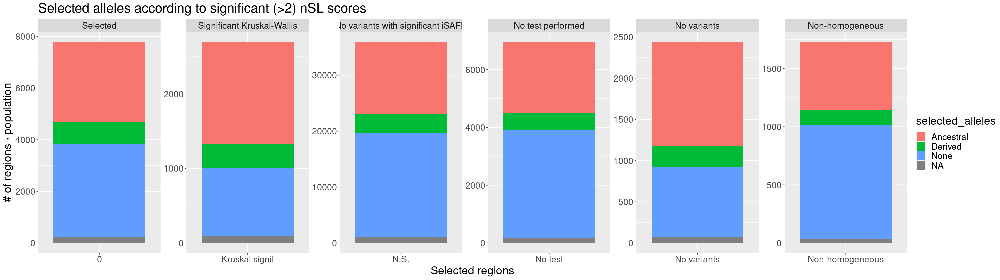

In [122]:
#Ara ja es pot representar l'histograma, amb aquestes dades. Ajunto les dos taules
taula <- rbind(nsl_filtrats, nsl_discarded)
options(repr.plot.width = 25, repr.plot.height = 7, warn = 1)
grafic <- taula %>% ggplot(mapping = aes(x = Cause, fill = selected_alleles)) + geom_bar() + 
    labs(x= 'Selected regions', y = '# of regions · population', title = 'Selected alleles according to significant (>2) nSL scores') +
    facet_wrap(~ Cause, ncol = 6,  scales = 'free', labeller = labeller(Cause = c('0' = 'Selected', 'Kruskal signif' = 'Significant Kruskal-Wallis', 'N.S.' = 'No variants with significant iSAFE', 
                                                                                 'No test' = 'No test performed', 'No variants' = 'No variants', 'Non-homogeneous' = 'Non-homogeneous'))) +
    theme(text = element_text(size = 20))
    #scale_fill_manual(values = metapopsData$colors, name = 'Population')  +
    #Faig servir facet_grid2 de ggh4x perquè deixa 'alliberar' l'eix y, mentre que facet_grid normal no deixa que canviï en una mateixa fila, que és el que necessito (amb l'argument independent)
rm(taula)
grafic

# Gene Ontology Enrichment Analysis

In [12]:
library(org.Hs.eg.db) #Per passar de les llistes de gens als IDs d'Entrez
library(topGO)
library(GO.db)

### Obtenció dels gens de cada rang d'edats

In [1]:
genelist <- function(genevector) {
    #Obtinc tots els noms de gens que hi ha al vector inicial separats amb comes
    genevector <- unique(unlist(strsplit(genevector, ',')))
    #Elimino els elements on hi diu noncoding, trobant els seus indexs dins del vector mitjançant grep
    indexs <- grep('nonCoding', genevector)
    if (length(indexs) > 0) {
        genevector <- genevector[- indexs]
    }
    return(genevector)
}

#Aquesta funció obté, a partir de la taula de resultats filtrats, una llista amb els gens que es troben a cada regió que mostra sweeps selectius per cada metapoblació per cada interval determinat en 
#generacions
metapop_genelist <- function(resultats_filtrats) {
    resultats_filtrats <- resultats_filtrats %>% #select('Region', 'GeneID', 'AFR', 'EUR', 'EAS', 'SAS', 'AFR_test', 'EUR_test', 'EAS_test', 'SAS_test') %>%
        pivot_longer(cols = c('AFR', 'EUR', 'EAS', 'SAS'),names_to = 'metapop_kruskal', values_to = 'sweepAge') %>% 
        #He de mirar si a la població que toca, s'ha fet un test estadístic i no és significatiu
        filter(!is.na(sweepAge) & ((metapop_kruskal == 'AFR' & AFR_test != 'None' & AFR_test != 'Non-homogeneous' & AFR_test >= 0.05) |
                               (metapop_kruskal == 'EUR' & EUR_test != 'None' & EUR_test != 'Non-homogeneous' & EUR_test >= 0.05) |
                               (metapop_kruskal == 'EAS' & EAS_test != 'None' & EAS_test != 'Non-homogeneous' & EAS_test >= 0.05) |
                               (metapop_kruskal == 'SAS' & SAS_test != 'None' & SAS_test != 'Non-homogeneous' & SAS_test >= 0.05))) %>%
        #Afegeixo una columna que agrupi l'edat dels sweeps
        mutate(sweepAgeGroup = as.character(NA))
    #Creo un vector amb els diferents límits entre grups que faré
    vect = c(0:14) * 5000 #Arribo fins a 70000 en intervals de 5000
    for (n in 2:15) {
        for (fila in 1:nrow(resultats_filtrats)) {
            valor <- resultats_filtrats[fila, 'sweepAge']
            #Per cada categoria de Sweep Ages que faig, miro si el valor en qüestió hi cau dins, i si és el cas ho poso a la columna sweepAgeGroup
            if (valor > vect[n-1] & valor <= vect[n]) {
                resultats_filtrats[fila, 'sweepAgeGroup'] <- paste(vect[n-1], vect[n], sep ='-')
            }
        }
    }
    #Creo una llista buida on guardar les subllistes de gens
    llista <- list()
    for (metapop in c('AFR', 'EUR', 'EAS', 'SAS')) {
        taula_temp <- resultats_filtrats %>% filter(metapop_kruskal == metapop)
        for (grup in unique(taula_temp$sweepAgeGroup)) {
            llista[[paste(metapop, grup, sep=':')]] <- c(genelist(taula_temp %>% filter(sweepAgeGroup == grup) %>% pull(GeneID)))
        }
    }
    return(llista)
}

In [2]:
genes_list <- metapop_genelist(resultats_filtrats)
print(genes_list)

ERROR: Error in resultats_filtrats %>% pivot_longer(cols = c("AFR", "EUR", "EAS", : could not find function "%>%"


## TopGO (abandonat)

### Obtenció dels elements necessaris per topGO

In [18]:
AllGenes <- scan('/home/anoguera/Data/GO_AllGenes.txt', character())
#Obtinc una llista amb tots els ID d'Entrez de tots els gens del genoma humà de RefSeq (75492)

In [116]:
#faig un vector amb tots els IDs de l'univers de gens com a noms, i el valor és 1 o 0 en funció e si és gen d'intered
llista <- select(org.Hs.eg.db, keys= AllGenes, columns=c('SYMBOL', 'ENTREZID', 'GO'), keytype="ENTREZID") %>% filter(ONTOLOGY == 'BP')
print(nrow(llista))

'select()' returned 1:many mapping between keys and columns



[1] 153102


In [ ]:
#Procés per crear la llista d'anotacions tal i com requereix el programa; ara ja només faig el source
annotations_list <- list()
for (ID in unique(llista$ENTREZID)) {
    annotations_list[[ID]] <- llista %>% filter(ENTREZID == ID) %>% pull(GO)#Em quedo amb la part de la taula referent al gen i que sigui informació de BP
}

In [50]:
source("/home/anoguera/scripts/src/annotations_list.R")
head(annotations_list, 2)

$`7157`
  [1] "GO:0000122" "GO:0000733" "GO:0001701" "GO:0001756" "GO:0001836"
  [6] "GO:0002244" "GO:0002309" "GO:0002326" "GO:0002360" "GO:0002931"
 [11] "GO:0006284" "GO:0006289" "GO:0006302" "GO:0006355" "GO:0006355"
 [16] "GO:0006606" "GO:0006914" "GO:0006974" "GO:0006974" "GO:0006977"
 [21] "GO:0006977" "GO:0006978" "GO:0006978" "GO:0006983" "GO:0007050"
 [26] "GO:0007050" "GO:0007179" "GO:0007265" "GO:0007275" "GO:0007369"
 [31] "GO:0007406" "GO:0007569" "GO:0008104" "GO:0008156" "GO:0008283"
 [36] "GO:0008285" "GO:0008285" "GO:0008285" "GO:0008340" "GO:0009299"
 [41] "GO:0009303" "GO:0009651" "GO:0010165" "GO:0010332" "GO:0010628"
 [46] "GO:0010628" "GO:0010628" "GO:0010666" "GO:0016032" "GO:0016579"
 [51] "GO:0019221" "GO:0021549" "GO:0030154" "GO:0030308" "GO:0030330"
 [56] "GO:0030330" "GO:0030512" "GO:0031065" "GO:0031497" "GO:0031571"
 [61] "GO:0032461" "GO:0033077" "GO:0034103" "GO:0034644" "GO:0035264"
 [66] "GO:0035690" "GO:0035794" "GO:0042149" "GO:0042771" "GO:0042771"
 [71] "GO:0042981" "GO:0042981" "GO:0043065" "GO:0043066" "GO:0043153"
 [76] "GO:0043504" "GO:0043516" "GO:0043525" "GO:0045861" "GO:0045892"
 [81] "GO:0045892" "GO:0045892" "GO:0045893" "GO:0045893" "GO:0045899"
 [86] "GO:0045944" "GO:0045944" "GO:0045944" "GO:0046677" "GO:0046827"
 [91] "GO:0046902" "GO:0048147" "GO:0048512" "GO:0048539" "GO:0048568"
 [96] "GO:0050731" "GO:0050821" "GO:0051097" "GO:0051123" "GO:0051262"
[101] "GO:0051289" "GO:0051289" "GO:0051402" "GO:0051974" "GO:0060218"
[106] "GO:0060333" "GO:0060411" "GO:0061419" "GO:0065003" "GO:0070059"
[111] "GO:0070245" "GO:0070266" "GO:0071158" "GO:0071158" "GO:0071456"
[116] "GO:0071479" "GO:0071480" "GO:0071494" "GO:0071850" "GO:0072331"
[121] "GO:0072332" "GO:0072363" "GO:0072717" "GO:0090200" "GO:0090343"
[126] "GO:0090399" "GO:0090403" "GO:0097193" "GO:0097252" "GO:1900119"
[131] "GO:1900740" "GO:1901525" "GO:1901796" "GO:1902108" "GO:1902253"
[136] "GO:1902749" "GO:1902895" "GO:1903799" "GO:1903800" "GO:1904024"
[141] "GO:1990144" "GO:1990440" "GO:2000269" "GO:2000378" "GO:2000379"
[146] "GO:2000772" "GO:2001244" "GO:2001244"

$`1956`
  [1] "GO:0000165" "GO:0000186" "GO:0001503" "GO:0001892" "GO:0001934"
  [6] "GO:0001942" "GO:0006357" "GO:0006412" "GO:0006970" "GO:0007165"
 [11] "GO:0007165" "GO:0007166" "GO:0007169" "GO:0007173" "GO:0007173"
 [16] "GO:0007173" "GO:0007202" "GO:0007435" "GO:0007494" "GO:0007611"
 [21] "GO:0007623" "GO:0008283" "GO:0008284" "GO:0008284" "GO:0008284"
 [26] "GO:0010750" "GO:0010960" "GO:0014066" "GO:0016101" "GO:0018108"
 [31] "GO:0021795" "GO:0030154" "GO:0030307" "GO:0030324" "GO:0030335"
 [36] "GO:0032930" "GO:0033138" "GO:0033590" "GO:0033594" "GO:0034614"
 [41] "GO:0038083" "GO:0038083" "GO:0038128" "GO:0042059" "GO:0042060"
 [46] "GO:0042177" "GO:0042327" "GO:0042698" "GO:0042743" "GO:0043006"
 [51] "GO:0043066" "GO:0043066" "GO:0043406" "GO:0043586" "GO:0045737"
 [56] "GO:0045739" "GO:0045740" "GO:0045746" "GO:0045780" "GO:0045893"
 [61] "GO:0045907" "GO:0045930" "GO:0045944" "GO:0046328" "GO:0046718"
 [66] "GO:0046777" "GO:0048143" "GO:0048146" "GO:0048546" "GO:0048661"
 [71] "GO:0048812" "GO:0050679" "GO:0050679" "GO:0050729" "GO:0050730"
 [76] "GO:0050999" "GO:0051205" "GO:0051592" "GO:0051897" "GO:0051897"
 [81] "GO:0051968" "GO:0060571" "GO:0061024" "GO:0061029" "GO:0070141"
 [86] "GO:0070372" "GO:0070374" "GO:0070374" "GO:0071230" "GO:0071260"
 [91] "GO:0071276" "GO:0071364" "GO:0071392" "GO:0071549" "GO:0090263"
 [96] "GO:0097421" "GO:0097755" "GO:0098609" "GO:1900020" "GO:1900087"
[101] "GO:1901185" "GO:1901224" "GO:1902722" "GO:1903078" "GO:1903800"
[106] "GO:1905208" "GO:2000145"

### Test de GO (s'ha de fer per cada element de la llista)

In [118]:
for (n in 1:length(genes_list)) {
    #Si no hi ha cap element en aquella època/metapop, me la salto
    if (length(genes_list[[n]]) > 0) {
        cat(names(genes_list)[n])
        #Ara faig un vector amb els gens interessants
        IDs <- mapIds(org.Hs.eg.db, genes_list[[n]], 'ENTREZID', 'SYMBOL')
        print(IDs)
        #I preparo la llista de gens de l'univers
        llista_gens <- factor(as.integer(unique(llista$ENTREZID) %in% IDs)) #Es posa un 0 si es FALSE i un 1 si és TRUE
        names(llista_gens) <- unique(llista$ENTREZID)
        #En alguns casos, cap dels gens interessants de la població es troba a llista_gens i per tant no hi ha cap 1; em salto la poblacio/epoca
        if (all(llista_gens == 0)) {
            print("
No es pot fer l'anàlisi")
            next
        }
        #Preparo l'objecte necessari per fer l'anàlisi de topGO
        GOdata <- new("topGOdata", ontology = "BP", #BP = Biological Process
                      allGenes = llista_gens, #He de posar l'univers de gens complert, com a vector on els noms és l'identificador del gen i el valor és 1 o 0 
                      annot = annFUN.gene2GO, gene2GO = annotations_list) #Les anotacions són gene to GO: una llista on, per cada ID de gen, hi hagi la informació de GO pertinent
        print(GOdata)
        #Faig l'anàlisi de GO
        resultFisher <- runTest(GOdata, algorithm = "classic", statistic = "fisher")
        n <- geneData(resultFisher)[['SigTerms']] #Serveix per comptar quants GO nodes s'han analitzat (Nontrivial)
        #Obtinc el resultat
        Result <- GenTable(GOdata, classicFisher = resultFisher, orderBy = "classicFisher",ranksOf = "classicFisher", topNodes = n)
        print(Result %>% mutate(pvalue_fdr = p.adjust(Result$classicFisher, method = 'fdr')) %>% head(n=10))
    }
}

AFR:10000-15000

'select()' returned 1:1 mapping between keys and columns



     ZMYM4   KIAA1107 AC104836.1    CYP2C18 AL583836.1      SRCAP AC106886.5 
    "9202"    "23285"         NA     "1562"         NA    "10847"         NA 
     ITFG1       PHKB     FBXL20     EXOC6B     ZNF514      MRPS5     STARD7 
   "81533"     "5257"    "84961"    "23233"    "84874"    "64969"    "56910" 
    INPP4A       MITF       FRYL     OCIAD1      EPM2A       FNTA AC110275.1 
    "3631"     "4286"   "285527"    "54940"     "7957"     "2339"         NA 
     MYBL1    CCDC171 
    "4603"   "203238" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 534 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0090044 positive regulation of tubulin deacetyla...         1           1
2  GO:0018343                       protein farnesylation         3           1
3  GO:0044336 canonical Wnt signaling pathway involved...         3           1
4  GO:0045213 neurotransmitter receptor metabolic proc...         3           1
5  GO:0099575 regulation of protein catabolic process ...         3           1
6  GO:1990511                  piRNA biosynthetic process         5           1
7  GO:0018344                 protein geranylgeranylation         7           1
8  GO:0090045 positive regulation of deacetylase activ...         8           1
9  GO:0090043         regulation of tubulin deacetylation         9           1
10 GO:0018342                         protein prenylation        10           1
   Expected classicFisher pvalue_fdr
1      0.00       0.00086  0.2744760
2      0.00       0.00257  0.2744760
3      0.

'select()' returned 1:1 mapping between keys and columns



  C1orf185       SBF2       GPHN      WDPCP    TMEM127     SPAG16      MYLK2 
  "284546"    "81846"    "10243"    "51057"    "55654"    "79582"    "85366" 
   C3orf67      RIMS1      KMT2C      HOOK3 AC110275.1     MCMDC2      RIMS2 
  "200844"    "22999"    "58508"    "84376"         NA   "157777"     "9699" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 626 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0097151 positive regulation of inhibitory postsy...         7           2
2  GO:0098828 modulation of inhibitory postsynaptic po...         7           2
3  GO:0048791 calcium ion-regulated exocytosis of neur...        16           2
4  GO:0060080           inhibitory postsynaptic potential        17           2
5  GO:1903861 positive regulation of dendrite extensio...        23           2
6  GO:1903859            regulation of dendrite extension        25           2
7  GO:2000463 positive regulation of excitatory postsy...        28           2
8  GO:0097484                          dendrite extension        35           2
9  GO:0016043             cellular component organization      6511          10
10 GO:0098815 modulation of excitatory postsynaptic po...        41           2
   Expected classicFisher  pvalue_fdr
1      0.00       6.6e-06 0.002065800
2      0.00       6.6e-06 0.002065800
3     

'select()' returned 1:1 mapping between keys and columns



      PKN2      CELF6 AC009690.1 AC009690.3 
    "5586"    "60677"         NA         NA 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 130 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0045070 positive regulation of viral genome repl...        35           1
2  GO:0032467          positive regulation of cytokinesis        40           1
3  GO:0006376                  mRNA splice site selection        53           1
4  GO:1903902     positive regulation of viral life cycle        61           1
5  GO:0043297                    apical junction assembly        64           1
6  GO:0000381 regulation of alternative mRNA splicing,...        65           1
7  GO:0000380 alternative mRNA splicing, via spliceoso...        76           1
8  GO:0000245               spliceosomal complex assembly        84           1
9  GO:0051781        positive regulation of cell division        87           1
10 GO:0032465                   regulation of cytokinesis        89           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0037  0.1075455
2      0.00        0.0043  0.1075455
3      0.

'select()' returned 1:1 mapping between keys and columns



   EVI5   ATXN2   SH2B3   PSKH1    ZNF2  PTPN13 
 "7813"  "6311" "10019"  "5681"  "7549"  "5783" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 6  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 6  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 348 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0035702                        monocyte homeostasis         2           1
2  GO:1900234         regulation of Kit signaling pathway         2           1
3  GO:1900235 negative regulation of Kit signaling pat...         2           1
4  GO:0036215                response to stem cell factor         4           1
5  GO:0036216 cellular response to stem cell factor st...         4           1
6  GO:0038109                       Kit signaling pathway         4           1
7  GO:0038163 thrombopoietin-mediated signaling pathwa...         5           1
8  GO:0036015                   response to interleukin-3         7           1
9  GO:0036016          cellular response to interleukin-3         7           1
10 GO:0070100 negative regulation of chemokine-mediate...         7           1
   Expected classicFisher pvalue_fdr
1         0       0.00064    0.07424
2         0       0.00064    0.07424
3        

'select()' returned 1:many mapping between keys and columns



  RABGAP1L     HIF1AN     NDUFB8 AL133352.1     ATRNL1       GPHN      EARS2 
    "9910"    "55662"     "4714"         NA    "26033"    "10243"   "124454" 
      GGA2       PHKB       SSH2      MEMO1      DPY30       FRYL     OCIAD2 
   "23062"     "5257"    "85464"     "7795"    "84661"   "285527"   "132299" 
     RASA1      RIMS1    TMEM248   SLC25A40      CSPP1      COPS5    ARFGEF1 
    "5921"    "22999"    "55069"    "55972"    "79848"    "10987"    "10565" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 18  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 18  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 668 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0018315 molybdenum incorporation into molybdenum...         1           1
2  GO:0036138            peptidyl-histidine hydroxylation         1           1
3  GO:0042040 metal incorporation into metallo-molybdo...         1           1
4  GO:0042265           peptidyl-asparagine hydroxylation         1           1
5  GO:0072579                 glycine receptor clustering         1           1
6  GO:0090284 positive regulation of protein glycosyla...         1           1
7  GO:0006424                glutamyl-tRNA aminoacylation         2           1
8  GO:0007529 establishment of synaptic specificity at...         2           1
9  GO:0042264        peptidyl-aspartic acid hydroxylation         2           1
10 GO:0001570                              vasculogenesis        79           2
   Expected classicFisher pvalue_fdr
1      0.00       0.00096  0.1068800
2      0.00       0.00096  0.1068800
3      0.

'select()' returned 1:1 mapping between keys and columns



   DLG2    VWA8  OCIAD1  ZNF131 
 "1740" "23078" "54940"  "7690" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 3  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 3  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 257 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0099642         retrograde axonal protein transport         2           1
2  GO:0099562 maintenance of postsynaptic density stru...         4           1
3  GO:0098880 maintenance of postsynaptic specializati...         6           1
4  GO:0099641        anterograde axonal protein transport         9           1
5  GO:0035865          cellular response to potassium ion        10           1
6  GO:0046710                       GDP metabolic process        10           1
7  GO:1905383          protein localization to presynapse        11           1
8  GO:0099640             axo-dendritic protein transport        12           1
9  GO:0099633 protein localization to postsynaptic spe...        13           1
10 GO:0099645 neurotransmitter receptor localization t...        13           1
   Expected classicFisher pvalue_fdr
1         0       0.00032 0.04129133
2         0       0.00064 0.04129133
3        

'select()' returned 1:1 mapping between keys and columns



   EPB42   RANBP2     ORC2  FAM126B    CCL28 
  "2038"   "5903"   "4999" "285172"  "56477" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 457 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:1903237 negative regulation of leukocyte tetheri...         4           1
2  GO:0033133 positive regulation of glucokinase activ...         5           1
3  GO:1903301 positive regulation of hexokinase activi...         6           1
4  GO:1903236 regulation of leukocyte tethering or rol...         8           1
5  GO:0002692 negative regulation of cellular extravas...         9           1
6  GO:0033131          regulation of glucokinase activity        10           1
7  GO:1903299           regulation of hexokinase activity        11           1
8  GO:1904995 negative regulation of leukocyte adhesio...        11           1
9  GO:0020027                hemoglobin metabolic process        14           1
10 GO:0043249                      erythrocyte maturation        15           1
   Expected classicFisher pvalue_fdr
1         0        0.0011  0.1656625
2         0        0.0013  0.1656625
3        

'select()' returned 1:1 mapping between keys and columns



 STARD3   IKZF3 
"10948" "22806" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 169 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0099044 vesicle tethering to endoplasmic reticul...         2           1
2  GO:0006701           progesterone biosynthetic process         7           1
3  GO:0099022                           vesicle tethering         7           1
4  GO:0042448              progesterone metabolic process        16           1
5  GO:0006700    C21-steroid hormone biosynthetic process        26           1
6  GO:0045577        regulation of B cell differentiation        28           1
7  GO:0008207       C21-steroid hormone metabolic process        39           1
8  GO:0042181                 ketone biosynthetic process        42           1
9  GO:0030888          regulation of B cell proliferation        61           1
10 GO:0042446                hormone biosynthetic process        86           1
   Expected classicFisher pvalue_fdr
1      0.00       0.00021  0.0354900
2      0.00       0.00075  0.0422500
3      0.

'select()' returned 1:1 mapping between keys and columns



       RBM6       STPG2    KIAA1109       HLA-B        MICA        CDSN 
    "10180"    "285555"     "84162"      "3106" "100507436"      "1041" 
   PSORS1C1     C6orf15    PSORS1C2     C6orf10    HLA-DQB2 
   "170679"     "29113"    "170680"          NA      "3120" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 8  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 8  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 241 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0001913                T cell mediated cytotoxicity        49           2
2  GO:0001912 positive regulation of leukocyte mediate...        56           2
3  GO:0031343         positive regulation of cell killing        68           2
4  GO:0003336                     corneocyte desquamation         1           1
5  GO:1905715                 regulation of cornification         1           1
6  GO:1905716        negative regulation of cornification         1           1
7  GO:0001910 regulation of leukocyte mediated cytotox...        78           2
8  GO:0060333 interferon-gamma-mediated signaling path...        91           2
9  GO:0031341                  regulation of cell killing        98           2
10 GO:0002708 positive regulation of lymphocyte mediat...       105           2
   Expected classicFisher pvalue_fdr
1      0.02       0.00019 0.01618143
2      0.02       0.00024 0.01618143
3      0.

'select()' returned 1:1 mapping between keys and columns



TBC1D5 
"9779" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 78 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0002092 positive regulation of receptor internal...        24           1
2  GO:0048260 positive regulation of receptor-mediated...        51           1
3  GO:0002090      regulation of receptor internalization        55           1
4  GO:0042147     retrograde transport, endosome to Golgi        88           1
5  GO:0090630               activation of GTPase activity        97           1
6  GO:0048259 regulation of receptor-mediated endocyto...       103           1
7  GO:0031623                    receptor internalization       111           1
8  GO:0045807          positive regulation of endocytosis       153           1
9  GO:0016482                         cytosolic transport       158           1
10 GO:0042594                      response to starvation       191           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0013 0.06574286
2      0.00        0.0027 0.06574286
3      0.

'select()' returned 1:many mapping between keys and columns



  RABGAP1L      CAPN3 AC012651.1     ZNF609     RIPOR1      MEMO1      DPY30 
    "9910"      "825"         NA    "23060"    "79567"     "7795"    "84661" 
   PPP4R3B     EXOC6B     PSMD14       AGPS      HECW2       MLPH       RBM6 
   "57223"    "23233"    "10213"     "8540"    "57520"    "79083"    "10180" 
    TMEM33      GRID2      STPG2       HCN1    FAM172A 
   "55161"     "2895"   "285555"   "348980"    "83989" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 892 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0006810                                   transport      5189          11
2  GO:1990092          calcium-dependent self proteolysis         1           1
3  GO:0051234               establishment of localization      5314          11
4  GO:0008104                        protein localization      2765           8
5  GO:0051641                       cellular localization      2926           8
6  GO:0014718 positive regulation of satellite cell ac...         2           1
7  GO:0051179                                localization      6734          12
8  GO:0033036                  macromolecule localization      3116           8
9  GO:0014717 regulation of satellite cell activation ...         3           1
10 GO:0070315 G1 to G0 transition involved in cell dif...         3           1
   Expected classicFisher pvalue_fdr
1      4.45       0.00077  0.1790996
2      0.00       0.00086  0.1790996
3      4.

'select()' returned 1:many mapping between keys and columns



   AGBL4     FUT8     PHKB   CEP112    MEMO1    DPY30   ZNF514    MRPS5 
 "84871"   "2530"   "5257" "201134"   "7795"  "84661"  "84874"  "64969" 
 TMEM163    PGAP1  RAD54L2    NIPBL 
 "81615"  "80055"  "23132"  "25836" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 551 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0036071                       N-glycan fucosylation         1           1
2  GO:0061780                     mitotic cohesin loading         1           1
3  GO:0070550                           rDNA condensation         1           1
4  GO:0120187 positive regulation of protein localizat...         1           1
5  GO:1905309      positive regulation of cohesin loading         1           1
6  GO:1905405       regulation of mitotic cohesin loading         1           1
7  GO:1905406 positive regulation of mitotic cohesin l...         1           1
8  GO:0034087 establishment of mitotic sister chromati...         2           1
9  GO:0035261            external genitalia morphogenesis         2           1
10 GO:0061010                    gall bladder development         2           1
   Expected classicFisher pvalue_fdr
1         0       0.00059 0.04644143
2         0       0.00059 0.04644143
3        

'select()' returned 1:1 mapping between keys and columns



 EPS15   ELF1  OXCT1  EPM2A  RIMS2 
"2060" "1997" "5019" "7957" "9699" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 421 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0010646            regulation of cell communication      3542           5
2  GO:0023051                     regulation of signaling      3591           5
3  GO:0048583          regulation of response to stimulus      4342           5
4  GO:0019065 receptor-mediated endocytosis of virus b...         3           1
5  GO:0075509 endocytosis involved in viral entry into...         3           1
6  GO:0046952               ketone body catabolic process         4           1
7  GO:0099003       vesicle-mediated transport in synapse       206           2
8  GO:0030073                           insulin secretion       207           2
9  GO:0030072                   peptide hormone secretion       250           2
10 GO:0097151 positive regulation of inhibitory postsy...         7           1
   Expected classicFisher pvalue_fdr
1      0.95       0.00025 0.05473000
2      0.96       0.00026 0.05473000
3      1.

'select()' returned 1:1 mapping between keys and columns



   EPS15 RABGAP1L   SPATS2    ZNF99 RAP1GDS1   SLC9B1   UBE2D3    CISD2 
  "2060"   "9910"  "65244"   "7652"   "5910" "150159"   "7323" "493856" 
 TMEM248   CHRNA6 
 "55069"   "8973" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 8  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 8  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 430 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0019065 receptor-mediated endocytosis of virus b...         3           1
2  GO:0075509 endocytosis involved in viral entry into...         3           1
3  GO:0099003       vesicle-mediated transport in synapse       206           2
4  GO:0032471 negative regulation of endoplasmic retic...         8           1
5  GO:0051561 positive regulation of mitochondrial cal...        11           1
6  GO:0046907                     intracellular transport      1846           4
7  GO:0031034                    myosin filament assembly        12           1
8  GO:0031033                myosin filament organization        13           1
9  GO:0001921 positive regulation of receptor recyclin...        15           1
10 GO:0006895                 Golgi to endosome transport        17           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0013  0.2041414
2      0.00        0.0013  0.2041414
3      0.

'select()' returned 1:1 mapping between keys and columns



   DOCK3   SPATA5 
  "1795" "166378" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 95 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:1903997 positive regulation of non-membrane span...         7           1
2  GO:1903995 regulation of non-membrane spanning prot...         8           1
3  GO:0061098 positive regulation of protein tyrosine ...        55           1
4  GO:0061097 regulation of protein tyrosine kinase ac...        88           1
5  GO:0050731 positive regulation of peptidyl-tyrosine...       192           1
6  GO:0050730 regulation of peptidyl-tyrosine phosphor...       256           1
7  GO:0018108           peptidyl-tyrosine phosphorylation       363           1
8  GO:0018212              peptidyl-tyrosine modification       366           1
9  GO:0045860 positive regulation of protein kinase ac...       532           1
10 GO:0007283                             spermatogenesis       542           1
   Expected classicFisher pvalue_fdr
1      0.00       0.00075  0.0408500
2      0.00       0.00086  0.0408500
3      0.

'select()' returned 1:1 mapping between keys and columns



COMMD10 
"51397" 
[1] "No es pot fer l'anàlisi"
EUR:0-5000

'select()' returned 1:1 mapping between keys and columns



   PCGF6    NSUN3   ARL13B    DHFR2  STXBP5L    OXCT1 
 "84108"  "63899" "200894" "200895"   "9515"   "5019" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 6  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 6  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 443 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0002127       tRNA wobble base cytosine methylation         1           1
2  GO:0002101           tRNA wobble cytosine modification         2           1
3  GO:0002946                tRNA C5-cytosine methylation         2           1
4  GO:0046105              thymidine biosynthetic process         2           1
5  GO:0046120    deoxyribonucleoside biosynthetic process         2           1
6  GO:0046126 pyrimidine deoxyribonucleoside biosynthe...         2           1
7  GO:0060819 inactivation of X chromosome by genetic ...         3           1
8  GO:0021943         formation of radial glial scaffolds         4           1
9  GO:0046452             dihydrofolate metabolic process         4           1
10 GO:0046952               ketone body catabolic process         4           1
   Expected classicFisher pvalue_fdr
1         0       0.00032 0.04619857
2         0       0.00064 0.04619857
3        

'select()' returned 1:1 mapping between keys and columns



  MAMDC2 
"256691" 
[1] "No es pot fer l'anàlisi"
EUR:15000-20000

'select()' returned 1:1 mapping between keys and columns



    LRP5   GPR135    FRMD5    ACSM3  THUMPD1    ACSM1    TANC2    MYLK2 
  "4041"  "64582"  "84978"   "6296"  "55623" "116285"  "26115"  "85366" 
  STK32B    OXCT1    MMP16 
 "55351"   "5019"   "4325" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 513 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0042632                     cholesterol homeostasis        96           3
2  GO:0055092                          sterol homeostasis        97           3
3  GO:0055088                           lipid homeostasis       151           3
4  GO:0060612                  adipose tissue development        43           2
5  GO:0061178 regulation of insulin secretion involved...        57           2
6  GO:0018874                  benzoate metabolic process         1           1
7  GO:0035773 insulin secretion involved in cellular r...        64           2
8  GO:0019605                  butyrate metabolic process         2           1
9  GO:0006637                  acyl-CoA metabolic process       105           2
10 GO:0035383                 thioester metabolic process       105           2
   Expected classicFisher pvalue_fdr
1      0.06       2.1e-05 0.00564300
2      0.06       2.2e-05 0.00564300
3      0.

'select()' returned 1:1 mapping between keys and columns



   GPHN 
"10243" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 95 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0018315 molybdenum incorporation into molybdenum...         1           1
2  GO:0042040 metal incorporation into metallo-molybdo...         1           1
3  GO:0072579                 glycine receptor clustering         1           1
4  GO:0007529 establishment of synaptic specificity at...         2           1
5  GO:0097112 gamma-aminobutyric acid receptor cluster...         3           1
6  GO:0006777 Mo-molybdopterin cofactor biosynthetic p...         6           1
7  GO:0019720 Mo-molybdopterin cofactor metabolic proc...         6           1
8  GO:0032324 molybdopterin cofactor biosynthetic proc...         7           1
9  GO:0043545    molybdopterin cofactor metabolic process         7           1
10 GO:0051189          prosthetic group metabolic process         7           1
   Expected classicFisher  pvalue_fdr
1         0       5.4e-05 0.001710000
2         0       5.4e-05 0.001710000
3     

'select()' returned 1:1 mapping between keys and columns



  PTPMT1   KBTBD4    CELF1   NDUFS3  FAM180B  C1QTNF4     SSH2   CCDC43 
"114971"  "55709"  "10658"   "4722" "399888" "114900"  "85464" "124808" 
   MEIOC    BCAS3     ZNF2    NSUN3   ARL13B    DHFR2    STPG2   TRIM40 
"284071"  "54828"   "7549"  "63899" "200894" "200895" "285555" "135644" 
  VPS13B 
"157680" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 13  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 13  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 673 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0002127       tRNA wobble base cytosine methylation         1           1
2  GO:0002101           tRNA wobble cytosine modification         2           1
3  GO:0002946                tRNA C5-cytosine methylation         2           1
4  GO:0046105              thymidine biosynthetic process         2           1
5  GO:0046120    deoxyribonucleoside biosynthetic process         2           1
6  GO:0046126 pyrimidine deoxyribonucleoside biosynthe...         2           1
7  GO:0070105 positive regulation of interleukin-6-med...         2           1
8  GO:0051728 cell cycle switching, mitotic to meiotic...         3           1
9  GO:0051729 germline cell cycle switching, mitotic t...         3           1
10 GO:0060184                        cell cycle switching         3           1
   Expected classicFisher pvalue_fdr
1         0        0.0007  0.1301133
2         0        0.0014  0.1301133
3        

'select()' returned 1:1 mapping between keys and columns



     AGBL4   RABGAP1L       CCNY     PCDH15      ATXN2      SH2B3      MNAT1 
   "84871"     "9910"   "219771"    "65217"     "6311"    "10019"     "4331" 
     TAF4B      HECW2      SUMO1 AC079354.2      SNTG1 
    "6875"    "57520"     "7341"         NA    "54212" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 725 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0045737 positive regulation of cyclin-dependent ...        31           2
2  GO:1904031 positive regulation of cyclin-dependent ...        35           2
3  GO:0032413 negative regulation of ion transmembrane...        78           2
4  GO:0035702                        monocyte homeostasis         2           1
5  GO:1900234         regulation of Kit signaling pathway         2           1
6  GO:1900235 negative regulation of Kit signaling pat...         2           1
7  GO:1905775 negative regulation of DNA helicase acti...         2           1
8  GO:0032410 negative regulation of transporter activ...        89           2
9  GO:1904063 negative regulation of cation transmembr...        91           2
10 GO:0000079 regulation of cyclin-dependent protein s...       102           2
   Expected classicFisher pvalue_fdr
1      0.02       0.00015 0.06887500
2      0.02       0.00019 0.06887500
3      0.

'select()' returned 1:1 mapping between keys and columns



C1orf185     EVI5   GPR158    ZNF99     SMC6     GEN1   RANBP2     EDAR 
"284546"   "7813"  "57512"   "7652"  "79677" "348654"   "5903"  "10913" 
 CCDC138    XIRP2     MDC1    RIMS2     SMC2 
"165055" "129446"   "9656"   "9699"  "10592" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 11  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 676 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0006312                       mitotic recombination        22           2
2  GO:0007059                      chromosome segregation       321           3
3  GO:0071139 resolution of recombination intermediate...         2           1
4  GO:0071140 resolution of mitotic recombination inte...         2           1
5  GO:0051983        regulation of chromosome segregation       103           2
6  GO:0033133 positive regulation of glucokinase activ...         5           1
7  GO:0060605                       tube lumen cavitation         5           1
8  GO:0060662                   salivary gland cavitation         5           1
9  GO:0000070        mitotic sister chromatid segregation       151           2
10 GO:0010032             meiotic chromosome condensation         6           1
   Expected classicFisher pvalue_fdr
1      0.01       7.2e-05  0.0486720
2      0.19       0.00075  0.1626156
3      0.

'select()' returned 1:1 mapping between keys and columns



  CC2D1B    RPAP2    PPM1D    BCAS3    EHBP1    WDPCP  EIF2AK3   STARD7 
"200014"  "79871"   "8493"  "54828"  "23301"  "51057"   "9451"  "56910" 
 TMEM127     MBD5     AGPS CACNA2D2 CYB561D2  TMEM115 Z84492.1  RAD54L2 
 "55654"  "55777"   "8540"   "9254"  "11068"  "11070"       NA  "23132" 
   EPHA3   TMEM33    NIPBL     MCM4    USP20 
  "2042"  "55161"  "25836"   "4173"  "10868" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 20  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 20  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 939 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0051893       regulation of focal adhesion assembly        60           3
2  GO:0090109 regulation of cell-substrate junction as...        60           3
3  GO:0040014 regulation of multicellular organism gro...        66           3
4  GO:1903391 regulation of adherens junction organiza...        67           3
5  GO:0007045 cell-substrate adherens junction assembl...        81           3
6  GO:0048041                     focal adhesion assembly        81           3
7  GO:1901888        regulation of cell junction assembly        88           3
8  GO:0034333                  adherens junction assembly        90           3
9  GO:0007044            cell-substrate junction assembly        97           3
10 GO:0036499     PERK-mediated unfolded protein response        21           2
   Expected classicFisher pvalue_fdr
1      0.06       3.5e-05 0.01126800
2      0.06       3.5e-05 0.01126800
3      0.

'select()' returned 1:1 mapping between keys and columns



   TRPM1    ASAP2    CPSF3    GRID2   CEP85L    RIMS2 
  "4308"   "8853"  "51692"   "2895" "387119"   "9699" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 5  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 393 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0007215        glutamate receptor signaling pathway       100           2
2  GO:0060079           excitatory postsynaptic potential       100           2
3  GO:0099565 chemical synaptic transmission, postsyna...       108           2
4  GO:0060078 regulation of postsynaptic membrane pote...       140           2
5  GO:0048167           regulation of synaptic plasticity       187           2
6  GO:0006398 mRNA 3'-end processing by stem-loop bind...         5           1
7  GO:1900454 positive regulation of long-term synapti...         6           1
8  GO:0021684         cerebellar granular layer formation         7           1
9  GO:0021707     cerebellar granule cell differentiation         7           1
10 GO:0097151 positive regulation of inhibitory postsy...         7           1
   Expected classicFisher pvalue_fdr
1      0.03       0.00028 0.04323000
2      0.03       0.00028 0.04323000
3      0.

'select()' returned 1:1 mapping between keys and columns



    NME7  OR10AD1   ENTPD6    CADPS     ZPBP     VWC2  CYP51A1    LRRD1 
 "29922" "121275"    "955"   "8618"  "11055" "375567"   "1595" "401387" 
  TMEM64 
"169200" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 9  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 9  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 409 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0033488 cholesterol biosynthetic process via 24,...         1           1
2  GO:1990504               dense core granule exocytosis         9           1
3  GO:0006228                    UTP biosynthetic process        10           1
4  GO:1900222 negative regulation of amyloid-beta clea...        10           1
5  GO:0006183                    GTP biosynthetic process        11           1
6  GO:0046051                       UTP metabolic process        11           1
7  GO:0006241                    CTP biosynthetic process        14           1
8  GO:0046036                       CTP metabolic process        14           1
9  GO:1901070 guanosine-containing compound biosynthet...        14           1
10 GO:0009209 pyrimidine ribonucleoside triphosphate b...        15           1
   Expected classicFisher pvalue_fdr
1      0.00       0.00048  0.1963200
2      0.00       0.00433  0.2132135
3      0.

'select()' returned 1:many mapping between keys and columns



         SBF2       TMEM117          USP3          RAI1         TANC2 
      "81846"       "84216"        "9960"       "10743"       "26115" 
       ZNF559 ZNF559-ZNF177         MEMO1         DPY30        PSMD14 
      "84527"   "100529215"        "7795"       "84661"       "10213" 
       FANCD2       STXBP5L           EMB         EPM2A       TMEM248 
       "2177"        "9515"      "133418"        "7957"       "55069" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 13  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 13  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 610 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0035879           plasma membrane lactate transport         3           1
2  GO:1903706                   regulation of hemopoiesis       475           3
3  GO:2000348        regulation of CD40 signaling pathway         6           1
4  GO:0015727                           lactate transport         7           1
5  GO:0035873             lactate transmembrane transport         7           1
6  GO:0023035                      CD40 signaling pathway         8           1
7  GO:0006281                                  DNA repair       552           3
8  GO:0040015 negative regulation of multicellular org...        11           1
9  GO:0070593                     dendrite self-avoidance        16           1
10 GO:0016578                    histone deubiquitination        23           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0021  0.4026667
2      0.33        0.0039  0.4026667
3      0.

'select()' returned 1:1 mapping between keys and columns



        UGT2A1          CCL28         MARCH3         LUC7L2 C7orf55-LUC7L2 
       "10941"        "56477"             NA        "51631"             NA 
        MAMDC2 
      "256691" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 3  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 3  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 140 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:1903237 negative regulation of leukocyte tetheri...         4           1
2  GO:1903236 regulation of leukocyte tethering or rol...         8           1
3  GO:0002692 negative regulation of cellular extravas...         9           1
4  GO:1904995 negative regulation of leukocyte adhesio...        11           1
5  GO:0052695                    cellular glucuronidation        19           1
6  GO:0006063               uronic acid metabolic process        24           1
7  GO:0019585               glucuronate metabolic process        24           1
8  GO:0050901              leukocyte tethering or rolling        25           1
9  GO:0002691        regulation of cellular extravasation        28           1
10 GO:1904994 regulation of leukocyte adhesion to vasc...        28           1
   Expected classicFisher pvalue_fdr
1         0       0.00064    0.06195
2         0       0.00129    0.06195
3        

'select()' returned 1:1 mapping between keys and columns



TBC1D5 
"9779" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 1  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 78 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0002092 positive regulation of receptor internal...        24           1
2  GO:0048260 positive regulation of receptor-mediated...        51           1
3  GO:0002090      regulation of receptor internalization        55           1
4  GO:0042147     retrograde transport, endosome to Golgi        88           1
5  GO:0090630               activation of GTPase activity        97           1
6  GO:0048259 regulation of receptor-mediated endocyto...       103           1
7  GO:0031623                    receptor internalization       111           1
8  GO:0045807          positive regulation of endocytosis       153           1
9  GO:0016482                         cytosolic transport       158           1
10 GO:0042594                      response to starvation       191           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0013 0.06574286
2      0.00        0.0027 0.06574286
3      0.

'select()' returned 1:1 mapping between keys and columns



     ZMYM6 AC114490.2     MARCH3      LAMA2 
    "9204"         NA         NA     "3908" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 2  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 95 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0032224 positive regulation of synaptic transmis...         4           1
2  GO:0032222 regulation of synaptic transmission, cho...         6           1
3  GO:0000902                          cell morphogenesis      1034           2
4  GO:0007271          synaptic transmission, cholinergic        29           1
5  GO:0032989            cellular component morphogenesis      1143           2
6  GO:0014037                Schwann cell differentiation        37           1
7  GO:0007422       peripheral nervous system development        75           1
8  GO:0045995         regulation of embryonic development       132           1
9  GO:0050806 positive regulation of synaptic transmis...       168           1
10 GO:0050793         regulation of developmental process      2696           2
   Expected classicFisher pvalue_fdr
1      0.00       0.00043  0.0304000
2      0.00       0.00064  0.0304000
3      0.

'select()' returned 1:1 mapping between keys and columns



      SFPQ   C1orf185      RPAP2   RABGAP1L      KCTD3    CYP2C18 AL583836.1 
    "6421"   "284546"    "79871"     "9910"    "51133"     "1562"         NA 
      SBF2     SPATS2     ZNF609       CES3       RAI1      TANC2      MSGN1 
   "81846"    "65244"    "23060"    "23491"    "10743"    "26115"   "343930" 
     XIRP2       RBM6        EMB      UBE3C    PPP1R42      TEX10 
  "129446"    "10180"   "133418"     "9690"   "286187"    "54881" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 17  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 17  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 480 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0035879           plasma membrane lactate transport         3           1
2  GO:0098961 dendritic transport of ribonucleoprotein...         3           1
3  GO:0098963 dendritic transport of messenger ribonuc...         3           1
4  GO:0070940 dephosphorylation of RNA polymerase II C...         5           1
5  GO:1902177 positive regulation of oxidative stress-...         6           1
6  GO:0006805                xenobiotic metabolic process       125           2
7  GO:0015727                           lactate transport         7           1
8  GO:0035873             lactate transmembrane transport         7           1
9  GO:0098935                         dendritic transport         9           1
10 GO:0045876 positive regulation of sister chromatid ...        10           1
   Expected classicFisher pvalue_fdr
1      0.00        0.0027      0.352
2      0.00        0.0027      0.352
3      0.

'select()' returned 1:1 mapping between keys and columns



     ZMYM4      ABCB9   MPHOSPH9    CDK2AP1   C12orf65   RALGAPA1     ZNF514 
    "9202"    "23457"    "10198"     "8099"    "91574"   "253959"    "84874" 
     MRPS5      NIPBL       FNTA AC110275.1       MCM4 
   "64969"    "25836"     "2339"         NA     "4173" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 10  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 10  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 487 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0090312 positive regulation of protein deacetyla...        22           2
2  GO:0090311         regulation of protein deacetylation        44           2
3  GO:0061780                     mitotic cohesin loading         1           1
4  GO:0070550                           rDNA condensation         1           1
5  GO:0090044 positive regulation of tubulin deacetyla...         1           1
6  GO:0120187 positive regulation of protein localizat...         1           1
7  GO:1905309      positive regulation of cohesin loading         1           1
8  GO:1905405       regulation of mitotic cohesin loading         1           1
9  GO:1905406 positive regulation of mitotic cohesin l...         1           1
10 GO:0034087 establishment of mitotic sister chromati...         2           1
   Expected classicFisher pvalue_fdr
1      0.01       5.9e-05 0.02873300
2      0.02       0.00024 0.02922000
3      0.

'select()' returned 1:many mapping between keys and columns



   AGBL4     NME7     VWCE     DDB1   MRPL11    ATXN2    SH2B3   RIPOR1 
 "84871"  "29922" "220001"   "1642"  "65003"   "6311"  "10019"  "79567" 
   TANC2    TAF4B    ZNF99    MEMO1    DPY30     CHD6    EPHA3  FAM172A 
 "26115"   "6875"   "7652"   "7795"  "84661"  "84181"   "2042"  "83989" 
CDC42SE2     MAP7    CSPP1    COPS5 
 "56990"   "9053"  "79848"  "10987" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 19  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 19  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 823 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0000715 nucleotide-excision repair, DNA damage r...        23           2
2  GO:0035702                        monocyte homeostasis         2           1
3  GO:0097156          fasciculation of motor neuron axon         2           1
4  GO:1900234         regulation of Kit signaling pathway         2           1
5  GO:1900235 negative regulation of Kit signaling pat...         2           1
6  GO:0045806          negative regulation of endocytosis        68           2
7  GO:0006283 transcription-coupled nucleotide-excisio...        73           2
8  GO:0097155        fasciculation of sensory neuron axon         3           1
9  GO:0031048            chromatin silencing by small RNA         4           1
10 GO:0036215                response to stem cell factor         4           1
   Expected classicFisher pvalue_fdr
1      0.02       0.00025  0.2057500
2      0.00       0.00204  0.2163314
3      0.

'select()' returned 1:1 mapping between keys and columns



      EVI5       LRP5    SLCO1B3 AC011604.2      PSPC1      FRMD5   KIAA1328 
    "7813"     "4041"    "28234"         NA    "55269"    "84978"    "57536" 
      SMC6       GEN1     EXOC6B       MBD5      MYLK2      ARIH2      PBRM1 
   "79677"   "348654"    "23233"    "55777"    "85366"    "10425"    "55193" 
   STXBP5L      STPG2     MCMDC2    ARFGEF1      CSPP1      RIMS2     ZNF510 
    "9515"   "285555"   "157777"    "10565"    "79848"     "9699"    "22869" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 18  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 18  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 857 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0006312                       mitotic recombination        22           2
2  GO:0032386       regulation of intracellular transport       423           4
3  GO:0000707            meiotic DNA recombinase assembly         1           1
4  GO:0007146       meiotic recombination nodule assembly         1           1
5  GO:0042140 late meiotic recombination nodule assemb...         1           1
6  GO:0090284 positive regulation of protein glycosyla...         1           1
7  GO:0030073                           insulin secretion       207           3
8  GO:0060341         regulation of cellular localization       906           5
9  GO:0042593                         glucose homeostasis       241           3
10 GO:0033500                    carbohydrate homeostasis       242           3
   Expected classicFisher pvalue_fdr
1      0.02       0.00020 0.09624769
2      0.41       0.00062 0.09624769
3      0.

'select()' returned 1:1 mapping between keys and columns



    APIP     AGPS   CELSR1     TRMU    TTC38    PPARA   PKDREJ    CDPF1 
 "51074"   "8540"   "9620"  "55687"  "55020"   "5465"  "10343" "150383" 
   GTSE1    DOCK3 RAP1GDS1   CHRNA6  CCDC171 
 "51512"   "1795"   "5910"   "8973" "203238" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 10  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 10  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 940 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0035094                        response to nicotine        49           2
2  GO:0072366 regulation of cellular ketone metabolic ...         1           1
3  GO:0090251 protein localization involved in establi...         1           1
4  GO:0060488 orthogonal dichotomous subdivision of te...         2           1
5  GO:0060489 planar dichotomous subdivision of termin...         2           1
6  GO:0060490 lateral sprouting involved in lung morph...         2           1
7  GO:0072363 regulation of glycolytic process by posi...         2           1
8  GO:0072364 regulation of cellular ketone metabolic ...         2           1
9  GO:0072369 regulation of lipid transport by positiv...         2           1
10 GO:0019284 L-methionine salvage from S-adenosylmeth...         3           1
   Expected classicFisher pvalue_fdr
1      0.03       0.00030  0.1117556
2      0.00       0.00054  0.1117556
3      0.

'select()' returned 1:1 mapping between keys and columns



 LRRTM4 
"80059" 
[1] "No es pot fer l'anàlisi"
SAS:0-5000

'select()' returned 1:1 mapping between keys and columns



    SLC12A1       CTXN2       MYEF2     SLC24A5       WDPCP       NSUN3 
     "6557"    "399697"     "50804"    "283652"     "51057"     "63899" 
     ARL13B       DHFR2       OXCT1      TRIM40       HLA-B        MICA 
   "200894"    "200895"      "5019"    "135644"      "3106" "100507436" 
       CDSN    PSORS1C1     C6orf15    PSORS1C2 
     "1041"    "170679"     "29113"    "170680" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 14  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 14  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 726 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0001913                T cell mediated cytotoxicity        49           2
2  GO:0002127       tRNA wobble base cytosine methylation         1           1
3  GO:0003336                     corneocyte desquamation         1           1
4  GO:1905715                 regulation of cornification         1           1
5  GO:1905716        negative regulation of cornification         1           1
6  GO:0001912 positive regulation of leukocyte mediate...        56           2
7  GO:0031343         positive regulation of cell killing        68           2
8  GO:0002101           tRNA wobble cytosine modification         2           1
9  GO:0002946                tRNA C5-cytosine methylation         2           1
10 GO:0046105              thymidine biosynthetic process         2           1
   Expected classicFisher pvalue_fdr
1      0.04       0.00060 0.07510345
2      0.00       0.00075 0.07510345
3      0.

'select()' returned 1:1 mapping between keys and columns



   CPSF3   CLASP1   SLC9B1   UBE2D3    CISD2    OXCT1    EPM2A  TMEM248 
 "51692"  "23332" "150159"   "7323" "493856"   "5019"   "7957"  "55069" 



Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )




------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 7  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 7  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------




			 -- Classic Algorithm -- 

		 the algorithm is scoring 612 nontrivial nodes
		 parameters: 
			 test statistic: fisher



        GO.ID                                        Term Annotated Significant
1  GO:0046952               ketone body catabolic process         4           1
2  GO:1903690 negative regulation of wound healing, sp...         4           1
3  GO:0006398 mRNA 3'-end processing by stem-loop bind...         5           1
4  GO:0110011 regulation of basement membrane organiza...         5           1
5  GO:1904259 regulation of basement membrane assembly...         5           1
6  GO:1904261 positive regulation of basement membrane...         5           1
7  GO:2001197 basement membrane assembly involved in e...         5           1
8  GO:0030953             astral microtubule organization         7           1
9  GO:1903689 regulation of wound healing, spreading o...         7           1
10 GO:0090091 positive regulation of extracellular mat...         8           1
   Expected classicFisher pvalue_fdr
1         0        0.0015  0.1475357
2         0        0.0015  0.1475357
3        

'select()' returned 1:1 mapping between keys and columns



  MAMDC2 
"256691" 
[1] "No es pot fer l'anàlisi"


### Passos del GO (per una sola iteració)

In [68]:
#Ara faig un vector amb els gens interessants
IDs <- mapIds(org.Hs.eg.db, genes_list[[1]], 'ENTREZID', 'SYMBOL')
print(IDs)

llista_gens <- factor(as.integer(unique(llista$ENTREZID) %in% IDs)) #Es posa un 0 si es FALSE i un 1 si és TRUE
names(llista_gens) <- unique(llista$ENTREZID)

'select()' returned 1:1 mapping between keys and columns



     ZMYM4   KIAA1107 AC104836.1    CYP2C18 AL583836.1      SRCAP AC106886.5 
    "9202"    "23285"         NA     "1562"         NA    "10847"         NA 
     ITFG1       PHKB     FBXL20     EXOC6B     ZNF514      MRPS5     STARD7 
   "81533"     "5257"    "84961"    "23233"    "84874"    "64969"    "56910" 
    INPP4A       MITF       FRYL     OCIAD1      EPM2A       FNTA AC110275.1 
    "3631"     "4286"   "285527"    "54940"     "7957"     "2339"         NA 
     MYBL1    CCDC171 
    "4603"   "203238" 


In [69]:
GOdata <- new("topGOdata", ontology = "BP", #BP = Biological Process
              allGenes = llista_gens, #He de posar l'univers de gens complert, com a vector on els noms és l'identificador del gen i el valor és 1 o 0 en funció de si és seleccionat o no
              annot = annFUN.gene2GO, gene2GO = annotations_list) #Les anotacions són gene to GO: una llista on, per cada ID de gen, hi hagi la informació de GO pertinent


Building most specific GOs .....

	( 12271 GO terms found. )


Build GO DAG topology ..........

	( 16230 GO terms and 38557 relations. )


Annotating nodes ...............

	( 18664 genes annotated to the GO terms. )



In [70]:
print(GOdata)


------------------------- topGOdata object -------------------------

 Description:
   -   

 Ontology:
   -  BP 

 18664 available genes (all genes from the array):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 18664 feasible genes (genes that can be used in the analysis):
   - symbol:  7157 1956 348 7124 7422  ...
   - 16  significant genes. 

 GO graph (nodes with at least  1  genes):
   - a graph with directed edges
   - number of nodes = 16230 
   - number of edges = 38557 

------------------------- topGOdata object -------------------------



#### Procés de GO

In [71]:
resultFisher <- runTest(GOdata, algorithm = "classic", statistic = "fisher")
resultFisher


			 -- Classic Algorithm -- 

		 the algorithm is scoring 534 nontrivial nodes
		 parameters: 
			 test statistic: fisher




Description:  
Ontology: BP 
'classic' algorithm with the 'fisher' test
16230 GO terms scored: 12 terms with p < 0.01
Annotation data:
    Annotated genes: 18664 
    Significant genes: 16 
    Min. no. of genes annotated to a GO: 1 
    Nontrivial nodes: 534 

In [111]:
geneData(resultFisher)[['SigTerms']]

[1] 534

In [72]:
resultFisherElim <- runTest(GOdata, algorithm = "elim", statistic = "fisher")


			 -- Elim Algorithm -- 

		 the algorithm is scoring 534 nontrivial nodes
		 parameters: 
			 test statistic: fisher
			 cutOff: 0.01


	 Level 13:	3 nodes to be scored	(0 eliminated genes)


	 Level 12:	8 nodes to be scored	(0 eliminated genes)


	 Level 11:	16 nodes to be scored	(1 eliminated genes)


	 Level 10:	26 nodes to be scored	(4 eliminated genes)


	 Level 9:	41 nodes to be scored	(12 eliminated genes)


	 Level 8:	50 nodes to be scored	(20 eliminated genes)


	 Level 7:	67 nodes to be scored	(20 eliminated genes)


	 Level 6:	95 nodes to be scored	(29 eliminated genes)


	 Level 5:	98 nodes to be scored	(29 eliminated genes)


	 Level 4:	75 nodes to be scored	(29 eliminated genes)


	 Level 3:	38 nodes to be scored	(29 eliminated genes)


	 Level 2:	16 nodes to be scored	(29 eliminated genes)


	 Level 1:	1 nodes to be scored	(29 eliminated genes)



In [114]:
allRes <- GenTable(GOdata, classicFisher = resultFisher, orderBy = "classicFisher",ranksOf = "classicFisher", topNodes = 534) 
allRes %>% mutate(pvalue_fdr = p.adjust(allRes$classicFisher, method = 'fdr'))

GO.ID,Term,Annotated,Significant,Expected,classicFisher,pvalue_fdr
<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>
GO:0090044,positive regulation of tubulin deacetyla...,1,1,0.00,0.00086,0.2744760
GO:0018343,protein farnesylation,3,1,0.00,0.00257,0.2744760
GO:0044336,canonical Wnt signaling pathway involved...,3,1,0.00,0.00257,0.2744760
GO:0045213,neurotransmitter receptor metabolic proc...,3,1,0.00,0.00257,0.2744760
GO:0099575,regulation of protein catabolic process ...,3,1,0.00,0.00257,0.2744760
GO:1990511,piRNA biosynthetic process,5,1,0.00,0.00428,0.3707255
GO:0018344,protein geranylgeranylation,7,1,0.01,0.00599,0.3707255
GO:0090045,positive regulation of deacetylase activ...,8,1,0.01,0.00684,0.3707255
GO:0090043,regulation of tubulin deacetylation,9,1,0.01,0.00769,0.3707255


In [104]:
p.adjust(allRes$PCFisher, method = 'fdr')

[1] 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600
  [8] 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600
 [15] 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600
 [22] 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600 0.7778600
 [29] 0.7778600 0.7778600 0.8096129 0.8261887 0.8261887 0.8261887 0.8261887
 [36] 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887
 [43] 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887 0.8261887
 [50] 0.8261887 0.8261887 0.8261887 0.8261887 0.8480763 0.8480763 0.8480763
 [57] 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763
 [64] 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763
 [71] 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8480763 0.8731247
 [78] 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600
 [85] 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600 0.8757600
 [92] 0.8757600 0.8757600 0.8757600 0.8757600 0.8917800 0.8917800 0.8917800
 [99] 0.8917800 0.8917800 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[106] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[113] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[120] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[127] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[134] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[141] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[148] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[155] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[162] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[169] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[176] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[183] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[190] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[197] 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039 0.8978039
[204] 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147
[211] 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147
[218] 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147 0.9047147
[225] 0.9047147 0.9066491 0.9066491 0.9066491 0.9066491 0.9066491 0.9066491
[232] 0.9066491 0.9084731 0.9084731 0.9084731 0.9084731 0.9084731 0.9084731
[239] 0.9155552 0.9155552 0.9155552 0.9169543 0.9169543 0.9169543 0.9169543
[246] 0.9182195 0.9211500 0.9211500 0.9225747 0.9225747 0.9225747 0.9225747
[253] 0.9225747 0.9261563 0.9261563 0.9261563 0.9291186 0.9291186 0.9302523
[260] 0.9302523 0.9302523 0.9302523 0.9302523 0.9302523 0.9323842 0.9363859
[267] 0.9363859 0.9363859 0.9363859 0.9373572 0.9373572 0.9415676 0.9419760
[274] 0.9419760 0.9419760 0.9466891 0.9477054 0.9535165 0.9623484 0.9629103
[281] 0.9629103 0.9702894 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549
[288] 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549
[295] 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549
[302] 0.9772549 0.9772549 0.9772549 0.9772549 0.9772549 0.9801596 0.9809010
[309] 0.9809010 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204
[316] 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204
[323] 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204 0.9865204
[330] 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182
[337] 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182
[344] 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182
[351] 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182
[358] 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182 0.9895182
[365] 0.9895182 0.9895182 0.9895182 0.9895182 0.98

## GO amb gprofiler2 (per la terminal)

In [9]:
install.packages('gprofiler2')

Installing package into ‘/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6’
(as ‘lib’ is unspecified)

also installing the dependency ‘RCurl’


Warning message in install.packages("gprofiler2"):
“installation of package ‘RCurl’ had non-zero exit status”
Warning message in install.packages("gprofiler2"):
“installation of package ‘gprofiler2’ had non-zero exit status”


In [30]:
#Guardo genes_list per fer-ho servir a l'R de la terminal
dput(genes_list, file = "/home/anoguera/scripts/src/genes_list.R")

In [ ]:
#A la terminal he de fer source(direcció de dalt) per obtenir la taula i després aplico això:
resultats <- gost(genes_list, organism='hsapiens', evcodes= TRUE)[['result']]
#Després guardo els resultats amb fwrite i els puc tornar a obrir aqui

### Resultats

In [36]:
GOresult <- fread("/home/anoguera/Data/GOresults.csv")
GOresult %>% select(query, p_value, term_size, query_size, intersection_size, precision, source, term_name, intersection)

query,p_value,term_size,query_size,intersection_size,precision,source,term_name,intersection
<chr>,<dbl>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
AFR:0-5000,0.0044305685,24,8,2,0.2500000,GO:CC,MHC protein complex,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0048149473,25,8,2,0.2500000,GO:CC,integral component of lumenal side of endoplasmic reticulum membrane,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0048149473,25,8,2,0.2500000,GO:CC,lumenal side of endoplasmic reticulum membrane,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0079504417,32,8,2,0.2500000,GO:CC,lumenal side of membrane,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0254647601,57,8,2,0.2500000,GO:CC,ER to Golgi transport vesicle membrane,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0059989802,117,2,2,1.0000000,KEGG,Natural killer cell mediated cytotoxicity,"HLA-B,MICA"
AFR:0-5000,0.0160405978,191,2,2,1.0000000,KEGG,Kaposi sarcoma-associated herpesvirus infection,"HLA-B,MICA"
AFR:0-5000,0.0173413811,87,2,2,1.0000000,REAC,Interferon gamma signaling,"HLA-B,HLA-DQB2"
AFR:0-5000,0.0209051206,86,3,2,0.6666667,WP,Allograft rejection,"HLA-B,MICA"


In [31]:
GOresult10 <- fread("/home/anoguera/Data/GOresults10.csv") #Per intervals de 10000 en 10000 generacions enlloc de 5000
GOresult10 %>% select(query, p_value, term_size, query_size, intersection_size, precision, source, term_name, intersection)

query,p_value,term_size,query_size,intersection_size,precision,source,term_name,intersection
<chr>,<dbl>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
AFR:0-10000,0.0131966424,24,14,2,0.14285714,GO:CC,MHC protein complex,"HLA-B,HLA-DQB2"
AFR:0-10000,0.0143388888,25,14,2,0.14285714,GO:CC,integral component of lumenal side of endoplasmic reticulum membrane,"HLA-B,HLA-DQB2"
AFR:0-10000,0.0143388888,25,14,2,0.14285714,GO:CC,lumenal side of endoplasmic reticulum membrane,"HLA-B,HLA-DQB2"
AFR:0-10000,0.0236458584,32,14,2,0.14285714,GO:CC,lumenal side of membrane,"HLA-B,HLA-DQB2"
AFR:0-10000,0.0158116750,705,5,4,0.80000000,REAC,Cytokine Signaling in Immune system,"SH2B3,PTPN13,HLA-B,HLA-DQB2"
AFR:10000-20000,0.0150580130,1604,31,11,0.35483871,GO:BP,vesicle-mediated transport,"KIAA1107,RABGAP1L,GGA2,FBXL20,DPY30,EXOC6B,OCIAD1,OCIAD2,RIMS1,COPS5,ARFGEF1"
AFR:10000-20000,0.0092680598,11084,35,32,0.91428571,TF,Factor: E2F-4; motif: NGGCGGGAARN,"ZMYM4,KIAA1107,RABGAP1L,ATRNL1,GPHN,EARS2,GGA2,SRCAP,ITFG1,PHKB,SSH2,FBXL20,MEMO1,DPY30,EXOC6B,ZNF514,STARD7,INPP4A,MITF,FRYL,OCIAD1,OCIAD2,RASA1,RIMS1,EPM2A,TMEM248,SLC25A40,FNTA,MYBL1,COPS5,ARFGEF1,CCDC171"
AFR:10000-20000,0.0123590820,779,35,9,0.25714286,TF,Factor: YY2; motif: NCCGCCATNTY; match class: 1,"EARS2,ITFG1,PHKB,DPY30,STARD7,OCIAD1,FNTA,CSPP1,COPS5"
AFR:20000-30000,0.0112113274,6,16,2,0.12500000,GO:BP,modulation of inhibitory postsynaptic potential,"RIMS1,RIMS2"


In [37]:
GOresult1 <- fread("/home/anoguera/Data/GOresults1.csv")
GOresult1 %>% select(query, p_value, term_size, query_size, intersection_size, precision, source, term_name, intersection)

query,p_value,term_size,query_size,intersection_size,precision,source,term_name,intersection
<chr>,<dbl>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
AFR:11000-12000,0.049961230,1,1,1,1.0000000,HP,Gluten intolerance,SRCAP
AFR:11000-12000,0.049961230,1,1,1,1.0000000,HP,Humeral pseudarthrosis,SRCAP
AFR:12000-13000,0.049947455,2,1,1,1.0000000,CORUM,Farnesyltransferase,FNTA
AFR:12000-13000,0.036906580,34,7,2,0.2857143,MIRNA,hsa-miR-1258,"ZNF514,STARD7"
AFR:13000-14000,0.039931794,4,2,1,0.5000000,WP,Diclofenac metabolic pathway,CYP2C18
AFR:15000-16000,0.049795626,1,4,1,0.2500000,GO:MF,hypoxia-inducible factor-asparagine oxygenase activity,HIF1AN
AFR:15000-16000,0.049795626,1,4,1,0.2500000,GO:MF,peptidyl-histidine dioxygenase activity,HIF1AN
AFR:15000-16000,0.049795626,1,4,1,0.2500000,GO:MF,peptidyl-asparagine 3-dioxygenase activity,HIF1AN
AFR:17000-18000,0.049947455,2,1,1,1.0000000,CORUM,Sam68-p120GAP complex,RASA1


### Filtre de resultats

In [68]:
filtre_GO <- function(taula) {
    result <- data.table()
    for (metapoptime in unique(taula$query)) {
        #Agafo la part de la taula corresponent a la metapoblació i època i ordeno per p_valor
        taula_temp <- taula %>% filter(query == metapoptime) %>% select(query, p_value, term_size, query_size, intersection_size, source, term_name, intersection) %>%
            arrange(p_value)
        #Si tots tenen un sol gen, torno el de p-valor més significatiu
        if (all(taula_temp$intersection_size == 1)) {
            result <- rbind(result, head(taula_temp, n=1))
            next
        } else { #Si no, filtro que hi hagi més d'1 gen
            taula_temp <- taula_temp %>% filter(intersection_size > 1)
        }
        #Si només hi ha un resultat, ja guardo aquell
        if (nrow(taula_temp) == 1) {
            result <- rbind(result, taula_temp)
            next
        }
        #Busco el p_valor mínim per poder filtrar que no siguin molt majors que aquell
        min_pvalor <- min(taula_temp$p_value)
        taula_temp <- taula_temp %>% filter(p_value < 10*min_pvalor)
        #Si tots els registres son de FT, retorno el de p-valor menor
        if (all(taula_temp$source == 'TF')) {
            result <- rbind(result, head(taula_temp, n=1))
            next
        } else { #si no, filtro els que no siguin de FT 
            taula_temp <- taula_temp %>% filter(source != 'TF')
        }
        #finalment, dels resultats que ens queden, torno el que tingui més intersection size i menys p_valor, en segon lloc (per p_valor ja estava ordenat prèviament
        result <- rbind(result, head(taula_temp %>% arrange(desc(intersection_size)), n=1))
    }
    return(result)
}

In [69]:
filtre_GO(GOresult)

query,p_value,term_size,query_size,intersection_size,source,term_name,intersection
<chr>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>
AFR:0-5000,4.430569e-03,24,8,2,GO:CC,MHC protein complex,"HLA-B,HLA-DQB2"
AFR:10000-15000,2.084523e-02,6,6,2,HP,Giant somatosensory evoked potentials,"STARD7,EPM2A"
AFR:15000-20000,2.393073e-02,298,17,4,GO:MF,GTPase binding,"RABGAP1L,GGA2,RASA1,RIMS1"
AFR:20000-25000,6.468472e-04,260,11,4,GO:CC,cytoplasmic region,"WDPCP,SPAG16,RIMS1,RIMS2"
EAS:0-5000,1.906062e-02,52,17,3,TF,Factor: nerf; motif: AAMCCGGAAGTN; match class: 1,"NSUN3,DHFR2,VPS13B"
EAS:10000-15000,2.805494e-03,11,11,2,GO:MF,cyclin-dependent protein serine/threonine kinase activator activity,"CCNY,MNAT1"
EAS:15000-20000,3.765309e-03,72,8,3,REAC,SUMOylation of DNA damage response and repair proteins,"SMC6,RANBP2,MDC1"
EAS:30000-35000,1.665248e-02,56,4,2,KEGG,Pyrimidine metabolism,"NME7,ENTPD6"
EAS:5000-10000,3.233516e-02,63,18,3,GO:BP,regulation of cell-substrate junction assembly,"BCAS3,WDPCP,EPHA3"


### Representació en Heat Map

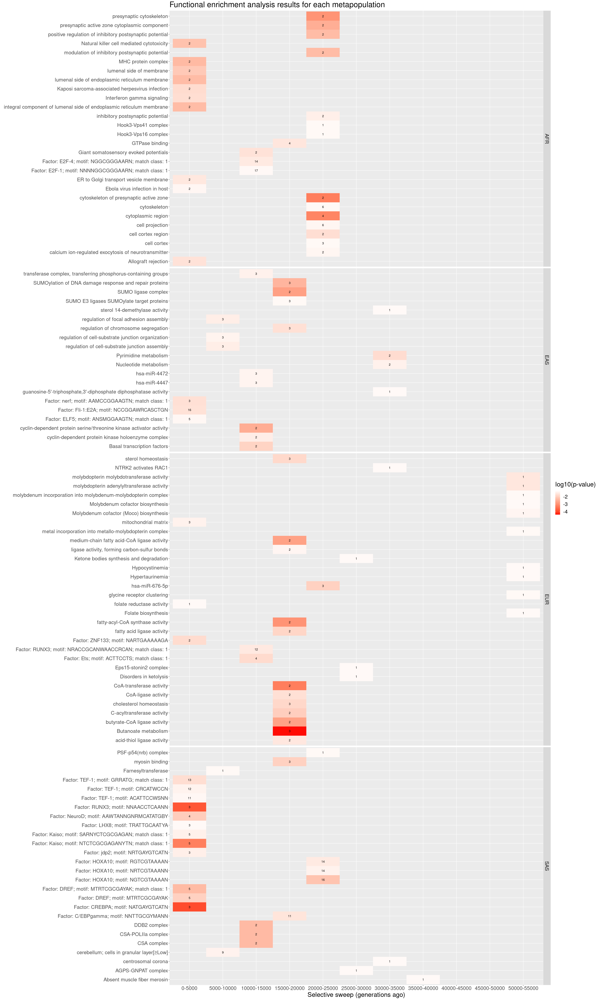

In [128]:
GOresult_metapop <- GOresult %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name)
options(repr.plot.width = 30, repr.plot.height = 50, warn = 1)
GOresult_metapop %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "red", high = "white", limits = c(-4.4,-1.2)) +
    facet_grid(rows  = vars(metapop), scale = 'free_y', space = 'free' ) +
    theme(text = element_text(size = 23)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results for each metapopulation', fill = 'log10(p-value)') +
    scale_x_discrete(limits = c('0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000',
                                '30000-35000', '35000-40000', '40000-45000', '45000-50000', '50000-55000'))

#### Gràfics per metapoblació

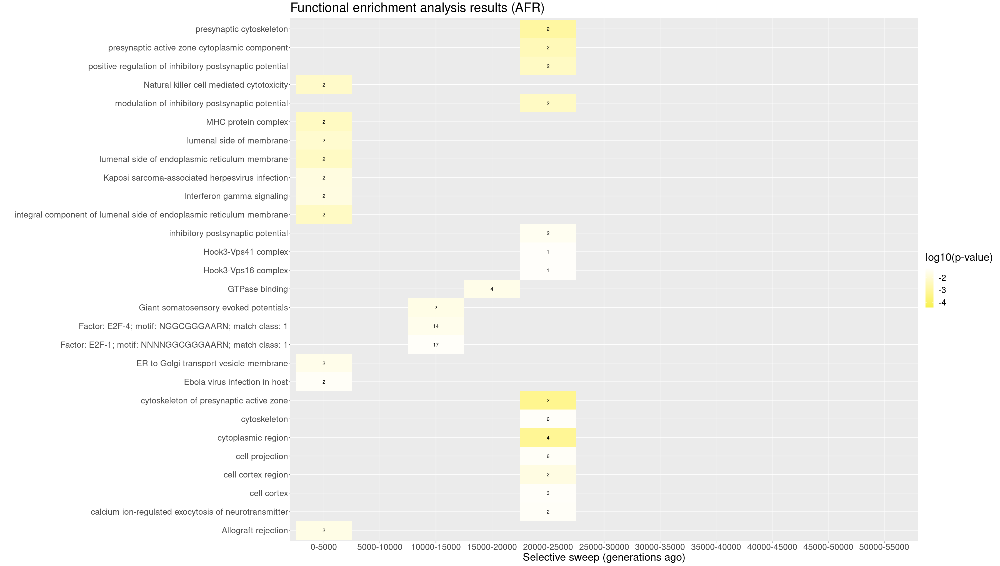

In [129]:
GOresult_AFR <- GOresult %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'AFR')
options(repr.plot.width = 30, repr.plot.height = 17, warn = 1)
GOresult_AFR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#F7F14A", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AFR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = c('0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000',
                                '30000-35000', '35000-40000', '40000-45000', '45000-50000', '50000-55000'))

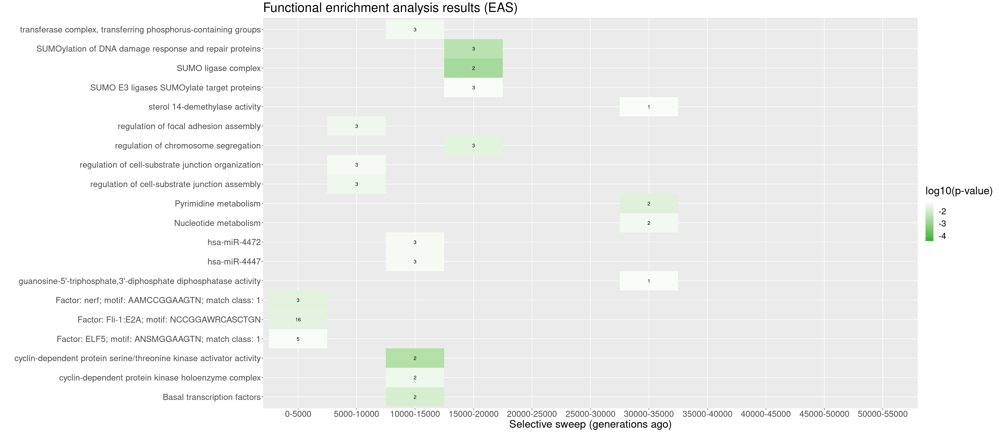

In [131]:
GOresult_EAS <- GOresult %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'EAS')
options(repr.plot.width = 30, repr.plot.height = 13, warn = 1)
GOresult_EAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#33B033", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = c('0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000',
                                '30000-35000', '35000-40000', '40000-45000', '45000-50000', '50000-55000'))

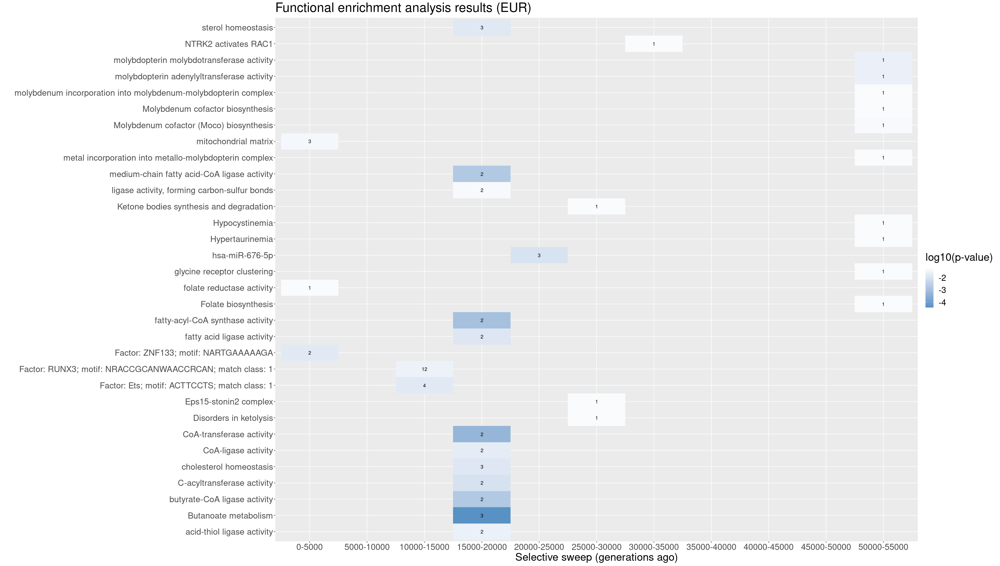

In [133]:
GOresult_EUR <- GOresult %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'EUR')
options(repr.plot.width = 30, repr.plot.height = 17, warn = 1)
GOresult_EUR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#5691C4", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EUR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = c('0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000',
                                '30000-35000', '35000-40000', '40000-45000', '45000-50000', '50000-55000'))

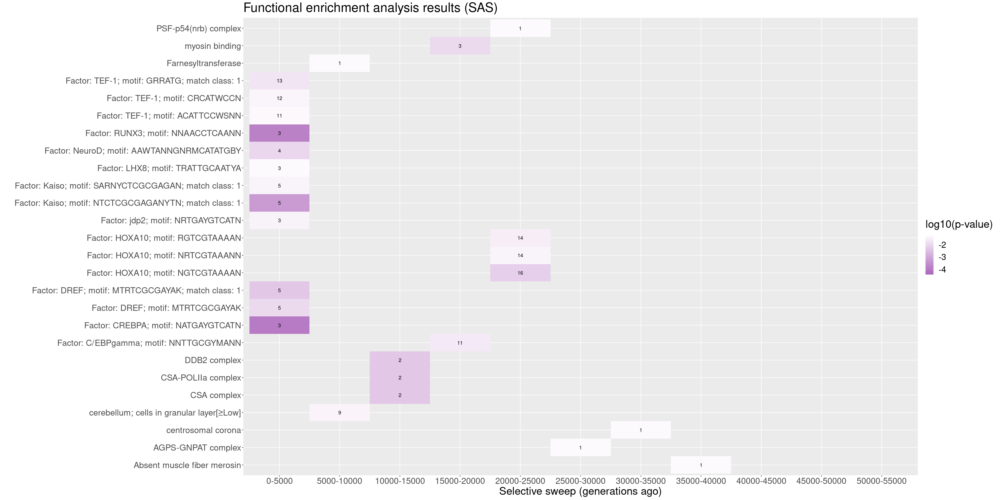

In [134]:
GOresult_SAS <- GOresult %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'SAS')
options(repr.plot.width = 30, repr.plot.height = 15, warn = 1)
GOresult_SAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#A965BA", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (SAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = c('0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000',
                                '30000-35000', '35000-40000', '40000-45000', '45000-50000', '50000-55000'))

## Representació en heat map (intervals de 1000 generacions)

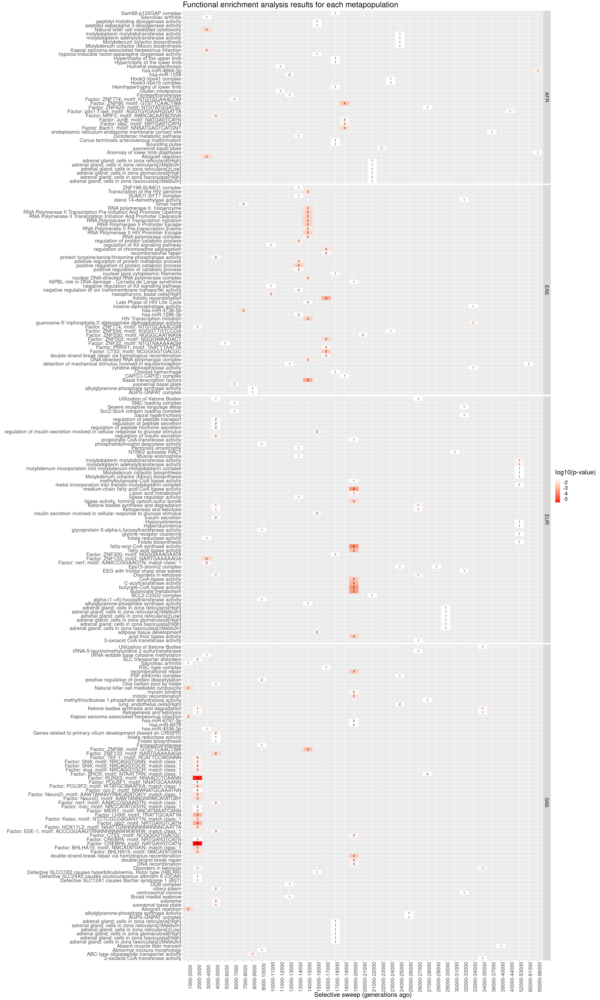

In [59]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:101) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-')
}
GOresult1_metapop <- GOresult1 %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name)
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1_metapop$generations]
#Represento el plot
options(repr.plot.width = 30, repr.plot.height = 50, warn = 1)
GOresult1_metapop %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "red", high = "white") +
    facet_grid(rows  = vars(metapop), scale = 'free_y', space = 'free' ) +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90) ) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results for each metapopulation', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

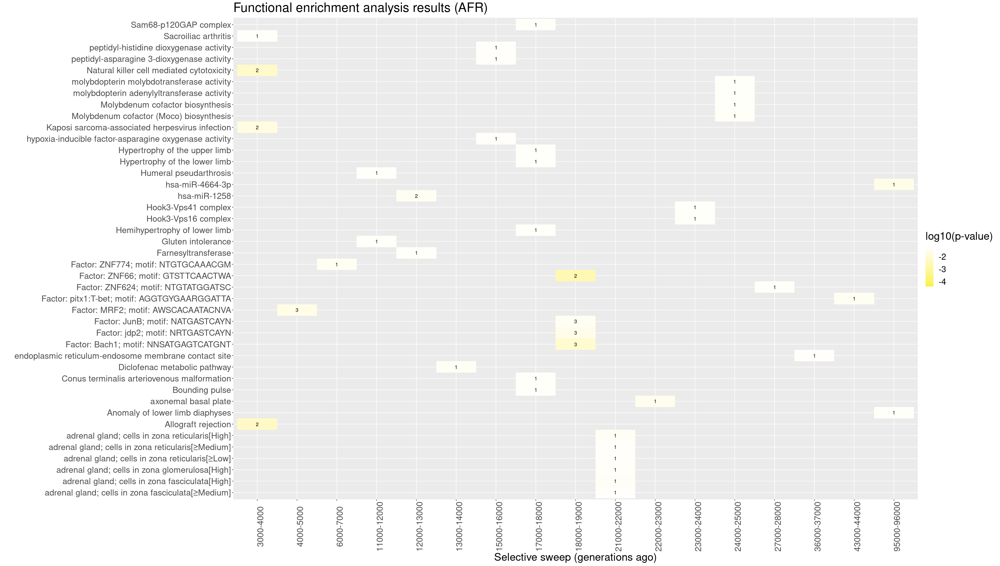

In [67]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:101) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-')
}
GOresult1_AFR <- GOresult1 %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'AFR')
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1_AFR$generations]
options(repr.plot.width = 30, repr.plot.height = 17, warn = 1)
GOresult1_AFR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#F7F14A", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AFR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

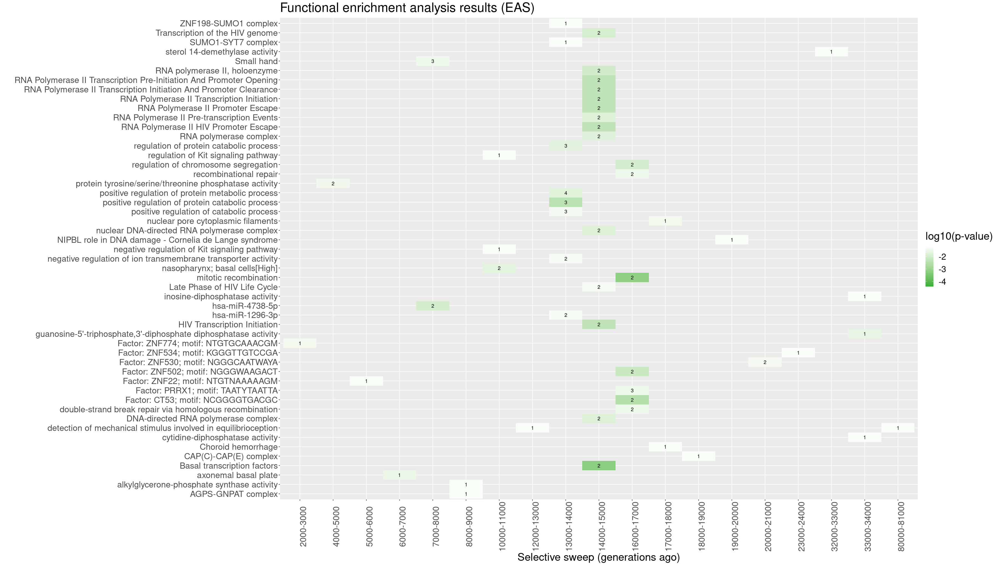

In [62]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:101) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-')
}
GOresult1_EAS <- GOresult1 %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'EAS')
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1_EAS$generations]
options(repr.plot.width = 30, repr.plot.height = 17, warn = 1)
GOresult1_EAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#33B033", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

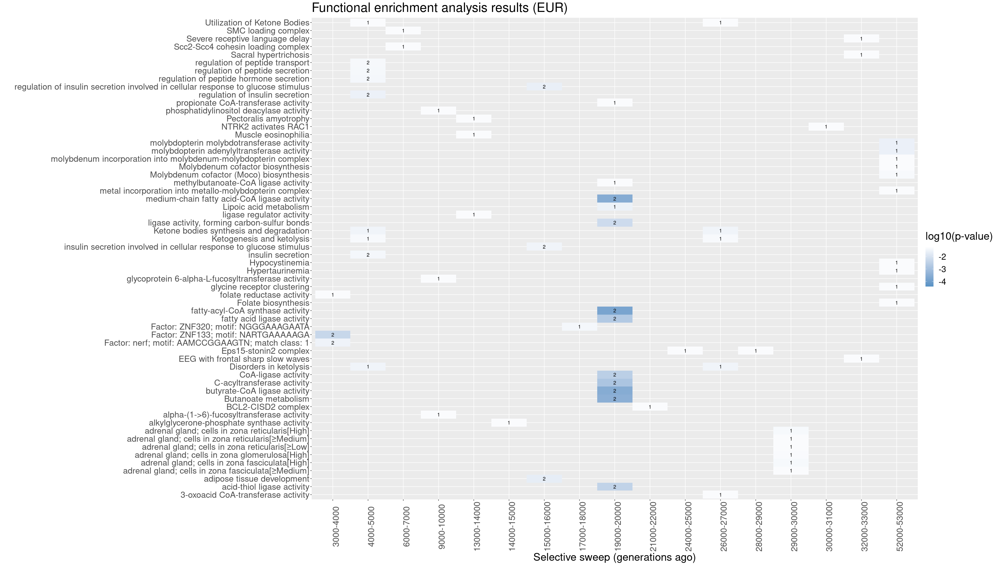

In [61]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:101) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-')
}
GOresult1_EUR <- GOresult1 %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'EUR')
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1_EUR$generations]
options(repr.plot.width = 30, repr.plot.height = 17, warn = 1)
GOresult1_EUR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#5691C4", high = "white", limits = c(-4.4,-1.2)) +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EUR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

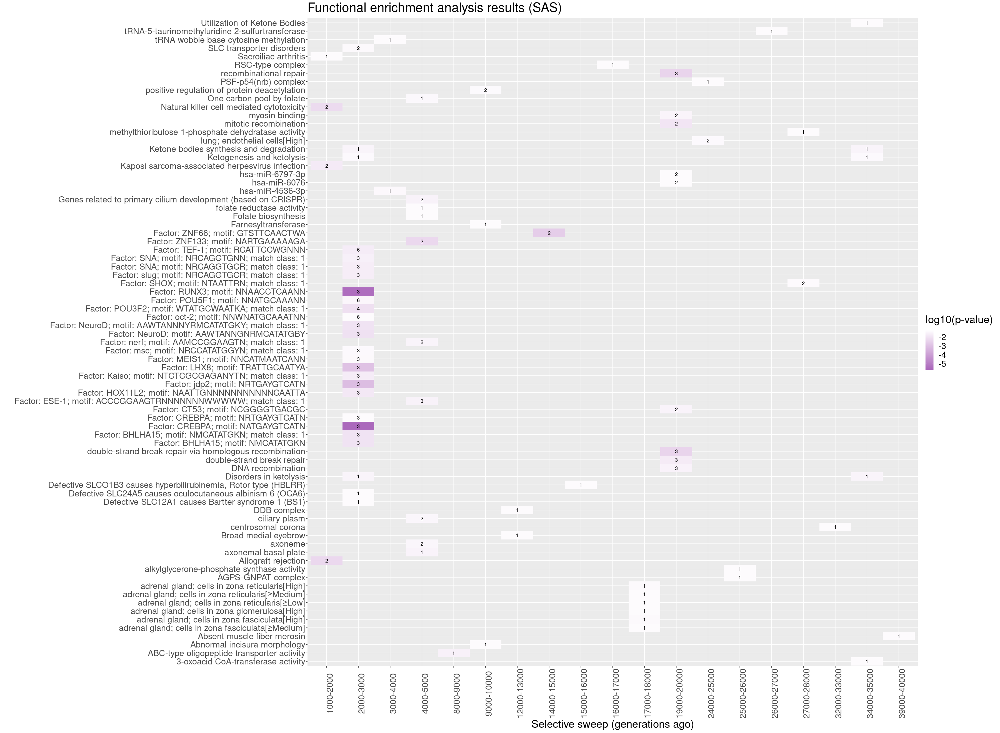

In [66]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:101) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-')
}
GOresult1_SAS <- GOresult1 %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(metapop, generations, p_value, intersection_size, term_name) %>%
filter(metapop == 'SAS')
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1_SAS$generations]
options(repr.plot.width = 30, repr.plot.height = 22, warn = 1)
GOresult1_SAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#A965BA", high = "white", limits = c(-5.7,-1.2)) +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (SAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

# Cosa per enviar a l'Aina: regions on hi hagi variants amb iSAFE significatiu i amb dades de Relate

In [135]:
#A aquesta funció se li dona el resultat de variantage_table i filtra aquelles regions que són d'interès
#(en el sentit que es detecti un sweep selectiu al menys a una metapoblació que concordi entre les subpoblacions)
#Es pot triar quin és el p_valor a partir del qual es consideren diferències significatives al cridar la funció
variantage_table_filter <- function(variantage_table_result, sign_level = 0.05) {
    #Filtro les files on cap de les metapoblacions tingui un resultat interessant:
    #Que s'hagi fet un test ANOVA i no hagi sortit significatiu per al menys una de les metapoblacions
    variantage_table_result <- variantage_table_result %>% filter( is.na(Cause) )
    #Aquests as.numeric() de sobre causen warnings pero justament m'interessa que si son strings es converteixin en NA per filtrar
    return(variantage_table_result)
}

In [139]:
fwrite(variantage_table_filter(resultats)[,1:2], file = '/home/anoguera/Data/phs_regions_aina.csv')

In [26]:
resultats %>% filter(AFR > 150000)

Region,ID,GeneID,metapop_PHS,AFR,AFR_n,AFR_test,AFR_aoh,EUR,EUR_n,⋯,BEB_age_sd,BEB_num,STU_isafe_max,STU_age_median,STU_age_sd,STU_num,ITU_isafe_max,ITU_age_median,ITU_age_sd,ITU_num
<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<int>,<int>,⋯,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>
18:58455340-58475340,1076,nonCoding80836,"EUR,SAS",154806,2,0.3153,2.574457e-06,18962,1,⋯,NA,NA,0.17760,12590.185,7173.294,12,0.10621,12492.405,2884.079,9
3:89419633-89450625,1627,EPHA3,AFR,167355,3,0,1.364720e-130,5473,2,⋯,NA,1,0.12167,7893.045,4979.545,2,NA,NA,NA,NA
8:42558673-42582528,2516,CHRNB3,"EUR,AFR,SAS,EAS",165023,2,0.0516,3.171104e-23,17877,3,⋯,30373.84,66,0.14243,17859.555,7977.288,8,0.18090,9103.885,3682.978,8


In [70]:
phs %>% filter(start == 58455340 | start == 42558673) %>% select(chr, start, end, statPop)

chr,start,end,statPop
<chr>,<int>,<int>,<chr>
chr18,58455340,58475340,"FayWu_H:BEB,FayWu_H:CEU,FayWu_H:FIN,FayWu_H:TSI"
chr8,42558673,42582528,"FayWu_H:ASW,FayWu_H:BEB,FayWu_H:CEU,FayWu_H:ESN,FayWu_H:FIN,FayWu_H:GBR,FayWu_H:GIH,FayWu_H:GWD,FayWu_H:IBS,FayWu_H:ITU,FayWu_H:KHV,FayWu_H:MSL,FayWu_H:PJL,FayWu_H:STU,FayWu_H:TSI,FayWu_H:YRI,FuLi_D:FIN"
